<a href="https://colab.research.google.com/github/Sarah-0405/Cold_Spots_Bayern/blob/main/Erreichbarkeiten_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Wegenetze aus drive laden

In [2]:
!pip install osmnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.3/101.3 kB 3.4 MB/s eta 0:00:00


In [3]:
import osmnx as ox
import os

# Directory where the graphml files are saved
output_dir = "/content/drive/MyDrive/Cold Spots Bayern/OSMnx_Wegegraphen"

# List to store the loaded graphs
graphs = {}

# Load the street networks from the graphml files
for filename in os.listdir(output_dir):
    if filename.endswith("_walk.graphml"):
        city_name = filename.replace("_walk.graphml", "").replace("_", " ")
        filepath = os.path.join(output_dir, filename)
        print(f"Loading street network for {city_name} from {filepath}...")
        try:
            G = ox.load_graphml(filepath)
            graphs[city_name] = G
            print(f"Loaded street network for {city_name}")
        except Exception as e:
            print(f"Could not load street network for {city_name}: {e}")

print("Finished loading street networks.")

# You can now access the graphs for each city using the 'graphs' dictionary
# For example, to access the graph for Munich:
# munich_graph = graphs["Munich"]

Loading street network for Aschaffenburg from /content/drive/MyDrive/Cold Spots Bayern/OSMnx_Wegegraphen/Aschaffenburg_walk.graphml...
Loaded street network for Aschaffenburg
Loading street network for Augsburg from /content/drive/MyDrive/Cold Spots Bayern/OSMnx_Wegegraphen/Augsburg_walk.graphml...
Loaded street network for Augsburg
Loading street network for Bamberg from /content/drive/MyDrive/Cold Spots Bayern/OSMnx_Wegegraphen/Bamberg_walk.graphml...
Loaded street network for Bamberg
Loading street network for Bayreuth from /content/drive/MyDrive/Cold Spots Bayern/OSMnx_Wegegraphen/Bayreuth_walk.graphml...
Loaded street network for Bayreuth
Loading street network for Erlangen from /content/drive/MyDrive/Cold Spots Bayern/OSMnx_Wegegraphen/Erlangen_walk.graphml...
Loaded street network for Erlangen
Loading street network for Fürth from /content/drive/MyDrive/Cold Spots Bayern/OSMnx_Wegegraphen/Fürth_walk.graphml...
Loaded street network for Fürth
Loading street network for Ingolst

# Cold Spots aus Drive laden

**München fehlt noch**

In [4]:
import geopandas as gpd
import os

# Define the base directory in Google Drive where the Cold Spot results are saved
input_base_dir = "/content/drive/MyDrive/Cold Spots Bayern/"

# Define the input folders for the different significance levels
input_folder_p005 = os.path.join(input_base_dir, "cold_spots_2024_p005")
input_folder_p010 = os.path.join(input_base_dir, "cold_spots_2024_p010")

# Initialize dictionaries to store the loaded Cold Spot geodataframes
loaded_cold_spots_2024_p005 = {}
loaded_cold_spots_2024_p010 = {}

print(f"Lade Cold Spots (p<0.05) aus dem Ordner: {input_folder_p005}")

# Load Cold Spots with p<0.05
if os.path.exists(input_folder_p005):
    for filename in os.listdir(input_folder_p005):
        if filename.endswith(".geojson"):
            file_path = os.path.join(input_folder_p005, filename)
            try:
                gdf = gpd.read_file(file_path)
                # Extract city name from filename (remove "_cold_spots_2024_p005.geojson" and replace underscores with spaces)
                city_name = filename.replace("_cold_spots_2024_p005.geojson", "").replace("_", " ")
                # Handle the umlaut and special characters in city names if necessary
                city_name = city_name.replace("ae", "ä").replace("oe", "ö").replace("ue", "ü").replace("Ue", "Ü")
                city_name = city_name.replace("Kempten Allgaeu", "Kempten (Allgäu)") # Specific handling for Kempten
                loaded_cold_spots_p005[city_name] = gdf
                print(f"  Geladen: {filename} ({city_name})")
            except Exception as e:
                print(f"  Fehler beim Laden von {filename}: {e}")
else:
    print(f"  Ordner nicht gefunden: {input_folder_p005}")


print(f"\nLade Cold Spots (p<0.10) aus dem Ordner: {input_folder_p010}")

# Load Cold Spots with p<0.10
if os.path.exists(input_folder_p010):
    for filename in os.listdir(input_folder_p010):
        if filename.endswith(".geojson"):
            file_path = os.path.join(input_folder_p010, filename)
            try:
                gdf = gpd.read_file(file_path)
                # Extract city name from filename (remove "_cold_spots_2024_p010.geojson" and replace underscores with spaces)
                city_name = filename.replace("_cold_spots_2024_p010.geojson", "").replace("_", " ")
                 # Handle the umlaut and special characters in city names if necessary
                city_name = city_name.replace("ae", "ä").replace("oe", "ö").replace("ue", "ü").replace("Ue", "Ü")
                city_name = city_name.replace("Kempten Allgaeu", "Kempten (Allgäu)") # Specific handling for Kempten
                loaded_cold_spots_2024_p010[city_name] = gdf
                print(f"  Geladen: {filename} ({city_name})")
            except Exception as e:
                print(f"  Fehler beim Laden von {filename}: {e}")
else:
     print(f"  Ordner nicht gefunden: {input_folder_p010}")


print("\nLaden der Cold Spot Ergebnisse abgeschlossen.")

# You can now access the loaded cold spot geodataframes using the dictionaries
# For example: munich_cold_spots_p005 = loaded_cold_spots_p005['Munich']

Lade Cold Spots (p<0.05) aus dem Ordner: /content/drive/MyDrive/Cold Spots Bayern/cold_spots_2024_p005
  Fehler beim Laden von Aschaffenburg_cold_spots_2024_p005.geojson: name 'loaded_cold_spots_p005' is not defined
  Fehler beim Laden von Augsburg_cold_spots_2024_p005.geojson: name 'loaded_cold_spots_p005' is not defined
  Fehler beim Laden von Bamberg_cold_spots_2024_p005.geojson: name 'loaded_cold_spots_p005' is not defined
  Fehler beim Laden von Erlangen_cold_spots_2024_p005.geojson: name 'loaded_cold_spots_p005' is not defined
  Fehler beim Laden von Ingolstadt_cold_spots_2024_p005.geojson: name 'loaded_cold_spots_p005' is not defined
  Fehler beim Laden von Landshut_cold_spots_2024_p005.geojson: name 'loaded_cold_spots_p005' is not defined
  Fehler beim Laden von Nuremberg_cold_spots_2024_p005.geojson: name 'loaded_cold_spots_p005' is not defined
  Fehler beim Laden von Passau_cold_spots_2024_p005.geojson: name 'loaded_cold_spots_p005' is not defined
  Fehler beim Laden von Rege

# Cold Spots in Polygone umwandeln und gruppieren

In [5]:
# Dictionary to store the resulting polygon GeoDataFrames for each city
cold_spot_polygons_2024_p010 = {}

for city_name, gdf in loaded_cold_spots_2024_p010.items():
    print(f"Processing city: {city_name}")
    # Reproject to a suitable projected CRS (e.g., UTM Zone 32N - EPSG:32632)
    gdf_projected = gdf.to_crs(epsg=32632)
    print(f"Reprojected {city_name} to EPSG:32632")

    # Create a 40x40 meter rectangular buffer around each point
    # The buffer is created using the 'buffer' method with a square cap style (cap_style=3)
    # and a width of 20 meters (half of the 40 meters side length)
    gdf_projected['geometry'] = gdf_projected.geometry.buffer(20, cap_style=3)
    print(f"Created 40x40 meter buffers for {city_name}")

    # Dissolve overlapping buffers
    dissolved_gdf = gdf_projected.dissolve()
    print(f"Dissolved buffers for {city_name}")

    # Explode multi-part polygons into single-part polygons
    exploded_gdf = dissolved_gdf.explode(index_parts=True)
    print(f"Exploded multi-part polygons for {city_name}")

    # Assign a unique group_id to each polygon
    exploded_gdf['group_id'] = range(len(exploded_gdf))
    print(f"Assigned group_ids for {city_name}")

    # Store the resulting GeoDataFrame in the dictionary
    cold_spot_polygons_2024_p010[city_name] = exploded_gdf
    print(f"Stored processed data for {city_name}")


print("\nFinished processing all cities and storing results.")

Processing city: Aschaffenburg
Reprojected Aschaffenburg to EPSG:32632
Created 40x40 meter buffers for Aschaffenburg
Dissolved buffers for Aschaffenburg
Exploded multi-part polygons for Aschaffenburg
Assigned group_ids for Aschaffenburg
Stored processed data for Aschaffenburg
Processing city: Augsburg
Reprojected Augsburg to EPSG:32632
Created 40x40 meter buffers for Augsburg
Dissolved buffers for Augsburg
Exploded multi-part polygons for Augsburg
Assigned group_ids for Augsburg
Stored processed data for Augsburg
Processing city: Bamberg
Reprojected Bamberg to EPSG:32632
Created 40x40 meter buffers for Bamberg
Dissolved buffers for Bamberg
Exploded multi-part polygons for Bamberg
Assigned group_ids for Bamberg
Stored processed data for Bamberg
Processing city: Bayreuth
Reprojected Bayreuth to EPSG:32632
Created 40x40 meter buffers for Bayreuth
Dissolved buffers for Bayreuth
Exploded multi-part polygons for Bayreuth
Assigned group_ids for Bayreuth
Stored processed data for Bayreuth
Proc

# Polygone in Linien umwandeln

In [21]:
import geopandas as gpd

# Dictionary to store the resulting boundary GeoDataFrames for each city
cold_spot_boundaries_2024_p010 = {}

# Convert polygons to boundaries for each city
for city_name, gdf_polygons in cold_spot_polygons_2024_p010.items():
    print(f"Converting polygons to boundaries for {city_name}...")
    try:
        # Get the boundary of each polygon
        gdf_boundaries = gdf_polygons.copy() # Create a copy to avoid modifying the original data
        gdf_boundaries['geometry'] = gdf_boundaries.geometry.boundary

        # The boundary operation might result in MultiLineStrings, explode them into single LineStrings
        gdf_boundaries = gdf_boundaries.explode(index_parts=True)

        cold_spot_boundaries_2024_p010[city_name] = gdf_boundaries
        print(f"Converted polygons to boundaries for {city_name}")
    except Exception as e:
        print(f"Could not convert polygons to boundaries for {city_name}: {e}")

print("\nFinished converting polygons to boundaries for all cities.")

# You can now access the boundary geodataframes using the 'cold_spot_boundaries_2019_2024_p010' dictionary

Converting polygons to boundaries for Aschaffenburg...
Converted polygons to boundaries for Aschaffenburg
Converting polygons to boundaries for Augsburg...
Converted polygons to boundaries for Augsburg
Converting polygons to boundaries for Bamberg...
Converted polygons to boundaries for Bamberg
Converting polygons to boundaries for Bayreuth...
Converted polygons to boundaries for Bayreuth
Converting polygons to boundaries for Erlangen...
Converted polygons to boundaries for Erlangen
Converting polygons to boundaries for Ingolstadt...
Converted polygons to boundaries for Ingolstadt
Converting polygons to boundaries for Landshut...
Converted polygons to boundaries for Landshut
Converting polygons to boundaries for Nuremberg...
Converted polygons to boundaries for Nuremberg
Converting polygons to boundaries for Passau...
Converted polygons to boundaries for Passau
Converting polygons to boundaries for Regensburg...
Converted polygons to boundaries for Regensburg
Converting polygons to bou

# Schnittpunkte mit Wegedaten finden

Keys in graphs dictionary:
['Aschaffenburg', 'Augsburg', 'Bamberg', 'Bayreuth', 'Erlangen', 'Fürth', 'Ingolstadt', 'Kempten (Allgäu)', 'Landshut', 'Munich', 'Nuremberg', 'Passau', 'Regensburg', 'Rosenheim', 'Schweinfurt', 'Würzburg']

Keys in cold_spot_boundaries_2024_p010 dictionary:
['Aschaffenburg', 'Augsburg', 'Bamberg', 'Bayreuth', 'Erlangen', 'Ingolstadt', 'Landshut', 'Nuremberg', 'Passau', 'Regensburg', 'Rosenheim', 'Schweinfurt', 'Fürth', 'Würzburg', 'Kempten Allgäu']

Attempting to process city: Aschaffenburg
  Accessed cold spot boundaries (Aschaffenburg) and street network (Aschaffenburg)
  Projecting graph for Aschaffenburg to EPSG:32632
  Finished projecting graph for Aschaffenburg
  Extracted and projected edges GeoDataFrame for Aschaffenburg
  CRS of cold spot boundaries GeoDataFrame matches edges for Aschaffenburg
  Finding intersections between cold spot boundaries and street network for Aschaffenburg...
  Finished finding intersections for Aschaffenburg. Found 98 i

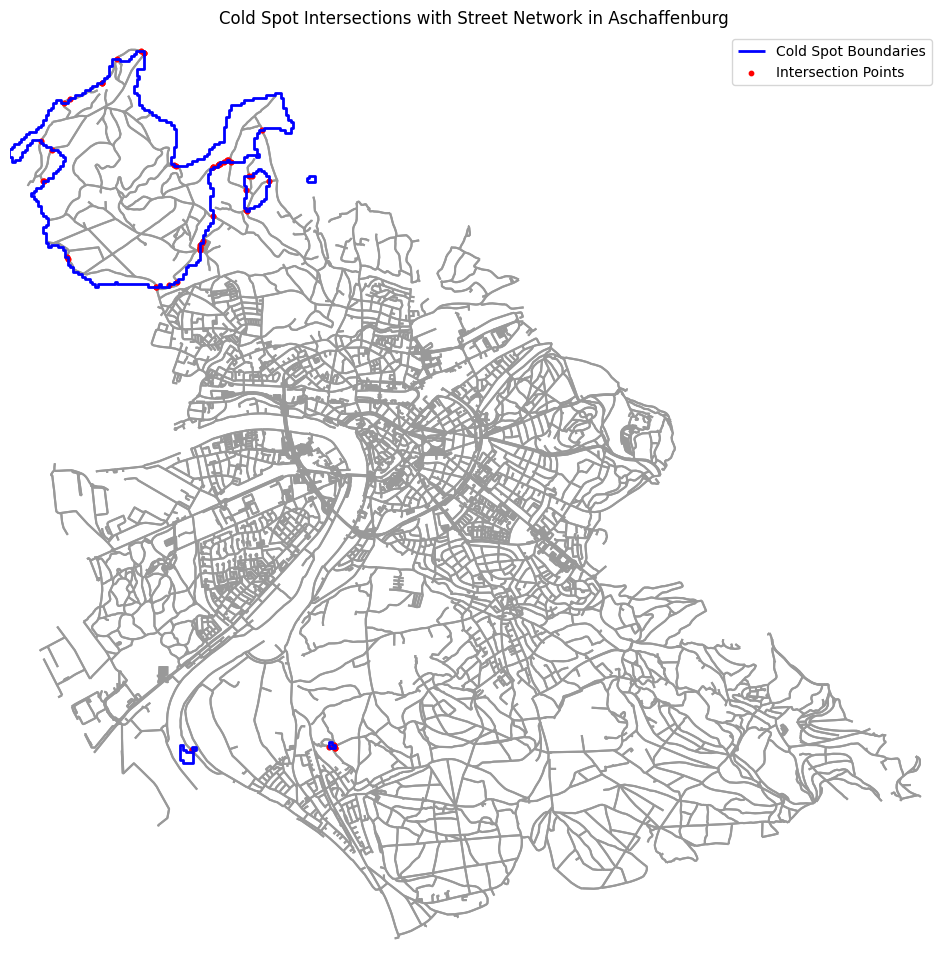

  Finished plotting for Aschaffenburg

Attempting to process city: Augsburg
  Accessed cold spot boundaries (Augsburg) and street network (Augsburg)
  Projecting graph for Augsburg to EPSG:32632
  Finished projecting graph for Augsburg
  Extracted and projected edges GeoDataFrame for Augsburg
  CRS of cold spot boundaries GeoDataFrame matches edges for Augsburg
  Finding intersections between cold spot boundaries and street network for Augsburg...
  Finished finding intersections for Augsburg. Found 394 intersection points.
  Created intersection points GeoDataFrame for Augsburg
  Plotting results for Augsburg...


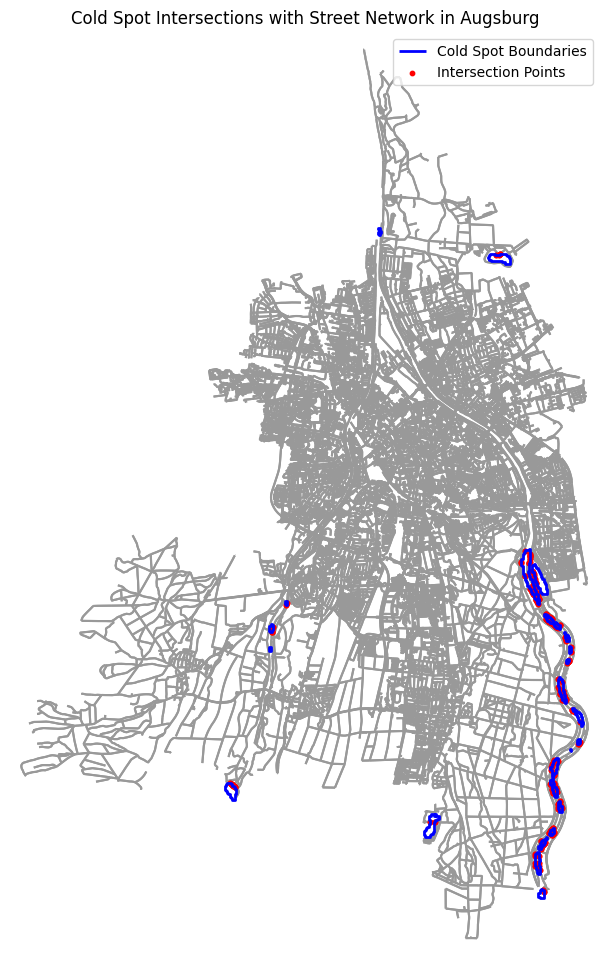

  Finished plotting for Augsburg

Attempting to process city: Bamberg
  Accessed cold spot boundaries (Bamberg) and street network (Bamberg)
  Projecting graph for Bamberg to EPSG:32632
  Finished projecting graph for Bamberg
  Extracted and projected edges GeoDataFrame for Bamberg
  CRS of cold spot boundaries GeoDataFrame matches edges for Bamberg
  Finding intersections between cold spot boundaries and street network for Bamberg...
  Finished finding intersections for Bamberg. Found 174 intersection points.
  Created intersection points GeoDataFrame for Bamberg
  Plotting results for Bamberg...


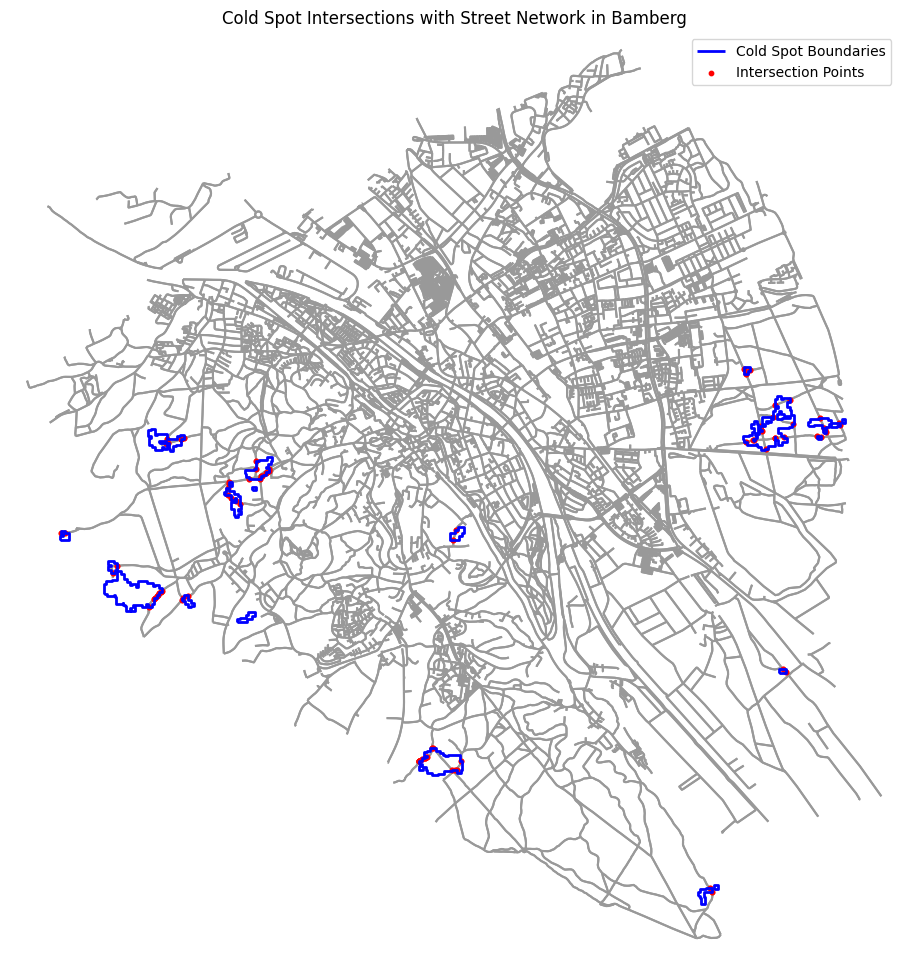

  Finished plotting for Bamberg

Attempting to process city: Bayreuth
  Accessed cold spot boundaries (Bayreuth) and street network (Bayreuth)
  Projecting graph for Bayreuth to EPSG:32632
  Finished projecting graph for Bayreuth
  Extracted and projected edges GeoDataFrame for Bayreuth
  CRS of cold spot boundaries GeoDataFrame matches edges for Bayreuth
  Finding intersections between cold spot boundaries and street network for Bayreuth...
  Finished finding intersections for Bayreuth. Found 136 intersection points.
  Created intersection points GeoDataFrame for Bayreuth
  Plotting results for Bayreuth...


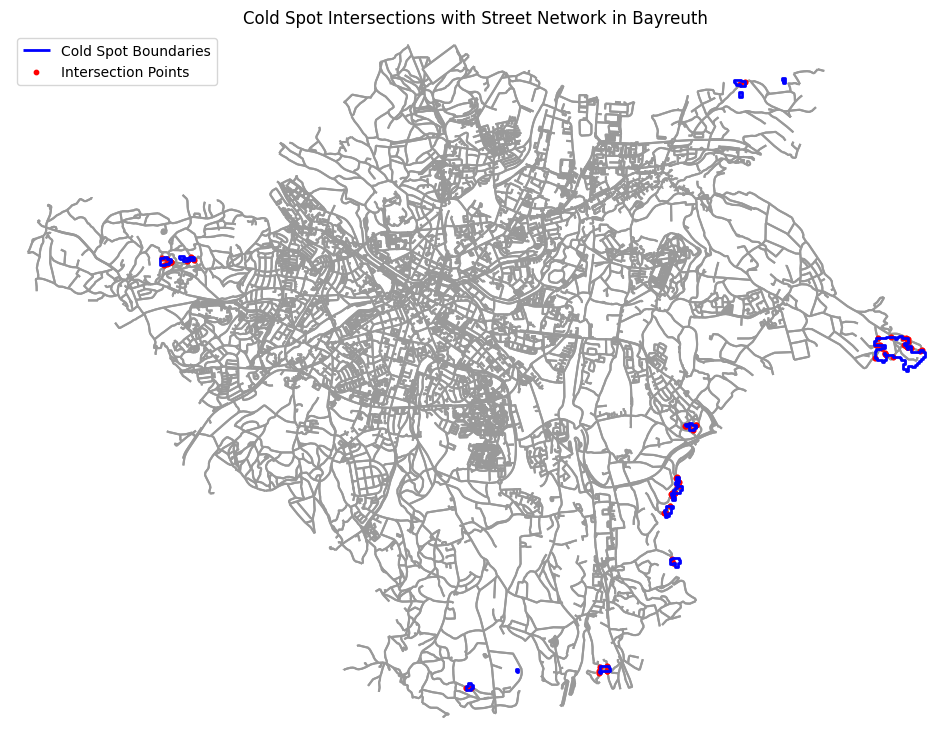

  Finished plotting for Bayreuth

Attempting to process city: Erlangen
  Accessed cold spot boundaries (Erlangen) and street network (Erlangen)
  Projecting graph for Erlangen to EPSG:32632
  Finished projecting graph for Erlangen
  Extracted and projected edges GeoDataFrame for Erlangen
  CRS of cold spot boundaries GeoDataFrame matches edges for Erlangen
  Finding intersections between cold spot boundaries and street network for Erlangen...
  Finished finding intersections for Erlangen. Found 422 intersection points.
  Created intersection points GeoDataFrame for Erlangen
  Plotting results for Erlangen...


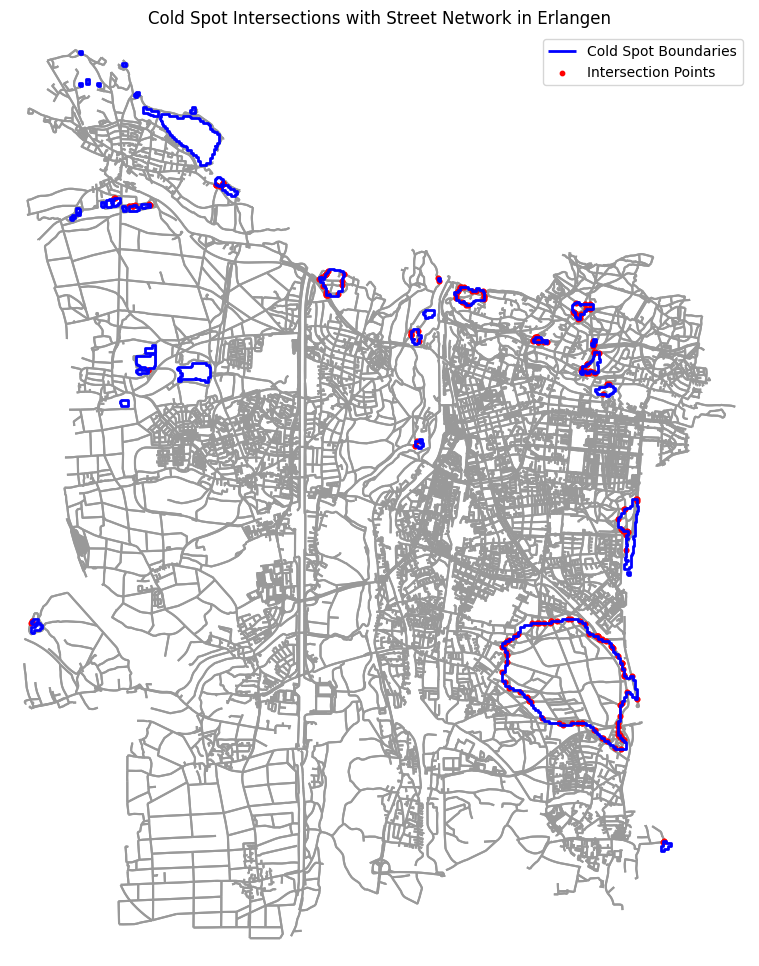

  Finished plotting for Erlangen

Attempting to process city: Fürth
  Accessed cold spot boundaries (Fürth) and street network (Fürth)
  Projecting graph for Fürth to EPSG:32632
  Finished projecting graph for Fürth
  Extracted and projected edges GeoDataFrame for Fürth
  CRS of cold spot boundaries GeoDataFrame matches edges for Fürth
  Finding intersections between cold spot boundaries and street network for Fürth...
  Finished finding intersections for Fürth. Found 682 intersection points.
  Created intersection points GeoDataFrame for Fürth
  Plotting results for Fürth...


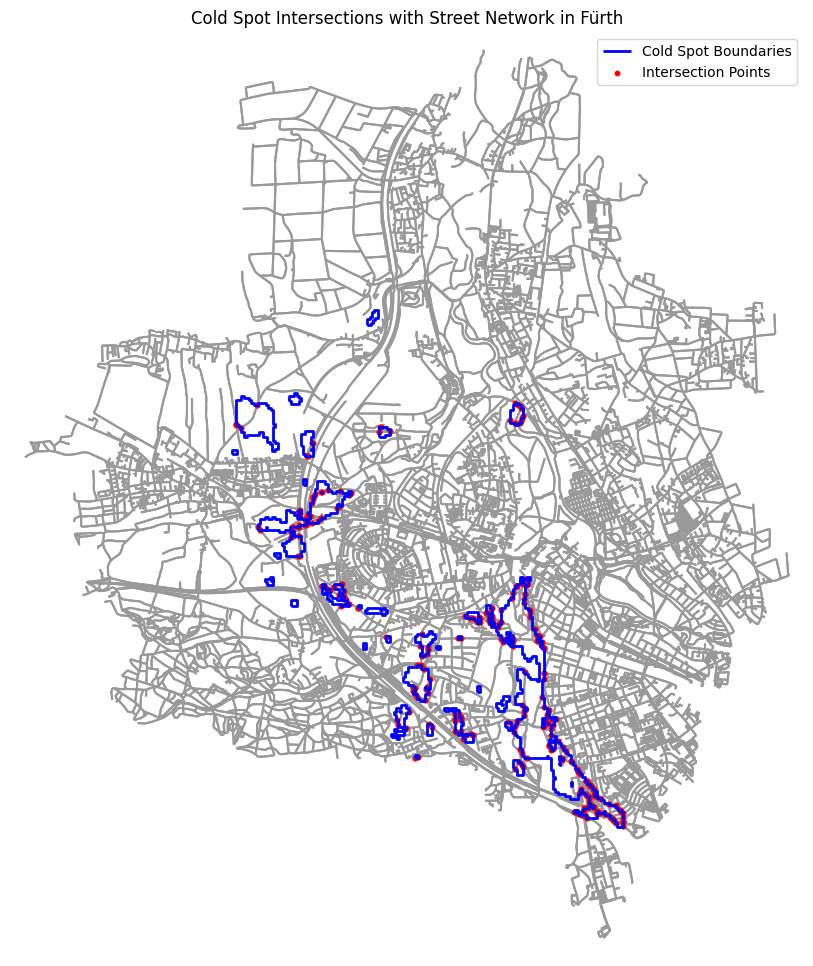

  Finished plotting for Fürth

Attempting to process city: Ingolstadt
  Accessed cold spot boundaries (Ingolstadt) and street network (Ingolstadt)
  Projecting graph for Ingolstadt to EPSG:32632
  Finished projecting graph for Ingolstadt
  Extracted and projected edges GeoDataFrame for Ingolstadt
  CRS of cold spot boundaries GeoDataFrame matches edges for Ingolstadt
  Finding intersections between cold spot boundaries and street network for Ingolstadt...
  Finished finding intersections for Ingolstadt. Found 612 intersection points.
  Created intersection points GeoDataFrame for Ingolstadt
  Plotting results for Ingolstadt...


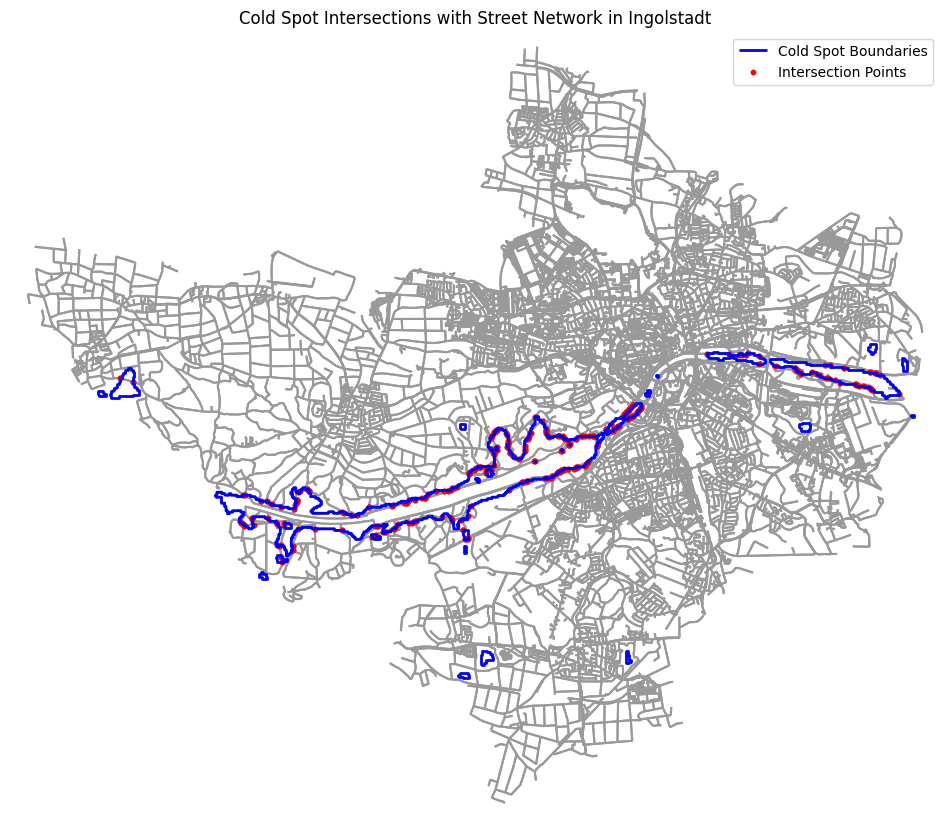

  Finished plotting for Ingolstadt

Attempting to process city: Kempten (Allgäu)
  Accessed cold spot boundaries (Kempten Allgäu) and street network (Kempten (Allgäu))
  Projecting graph for Kempten (Allgäu) to EPSG:32632
  Finished projecting graph for Kempten (Allgäu)
  Extracted and projected edges GeoDataFrame for Kempten (Allgäu)
  CRS of cold spot boundaries GeoDataFrame matches edges for Kempten (Allgäu)
  Finding intersections between cold spot boundaries and street network for Kempten (Allgäu)...
  Finished finding intersections for Kempten (Allgäu). Found 226 intersection points.
  Created intersection points GeoDataFrame for Kempten (Allgäu)
  Plotting results for Kempten (Allgäu)...


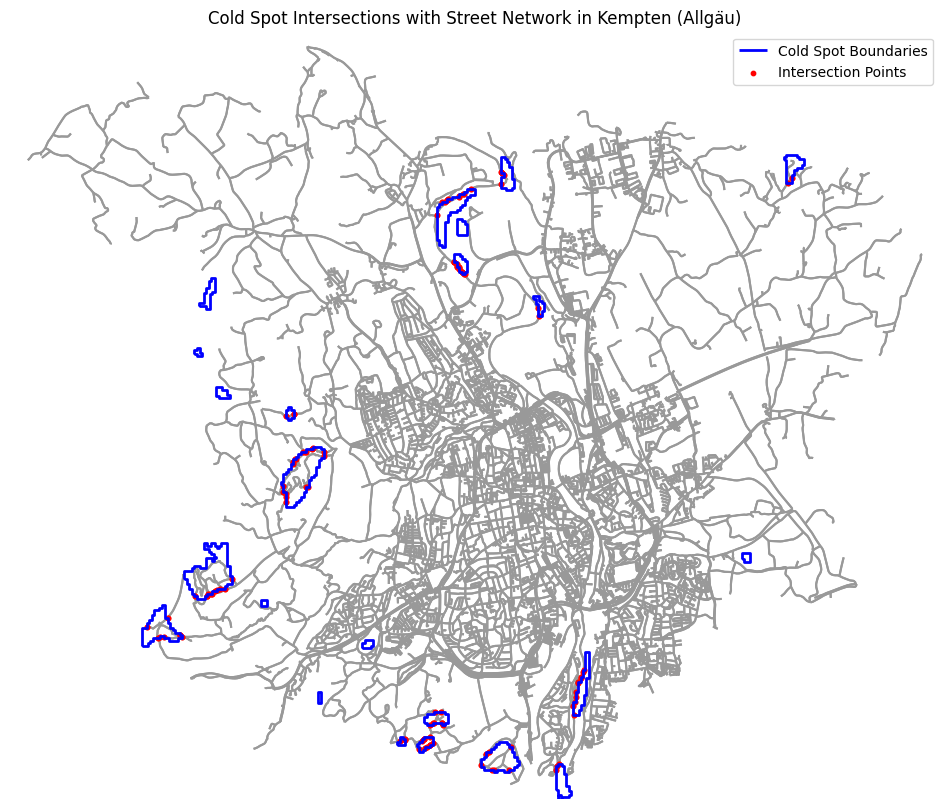

  Finished plotting for Kempten (Allgäu)

Attempting to process city: Landshut
  Accessed cold spot boundaries (Landshut) and street network (Landshut)
  Projecting graph for Landshut to EPSG:32632
  Finished projecting graph for Landshut
  Extracted and projected edges GeoDataFrame for Landshut
  CRS of cold spot boundaries GeoDataFrame matches edges for Landshut
  Finding intersections between cold spot boundaries and street network for Landshut...
  Finished finding intersections for Landshut. Found 172 intersection points.
  Created intersection points GeoDataFrame for Landshut
  Plotting results for Landshut...


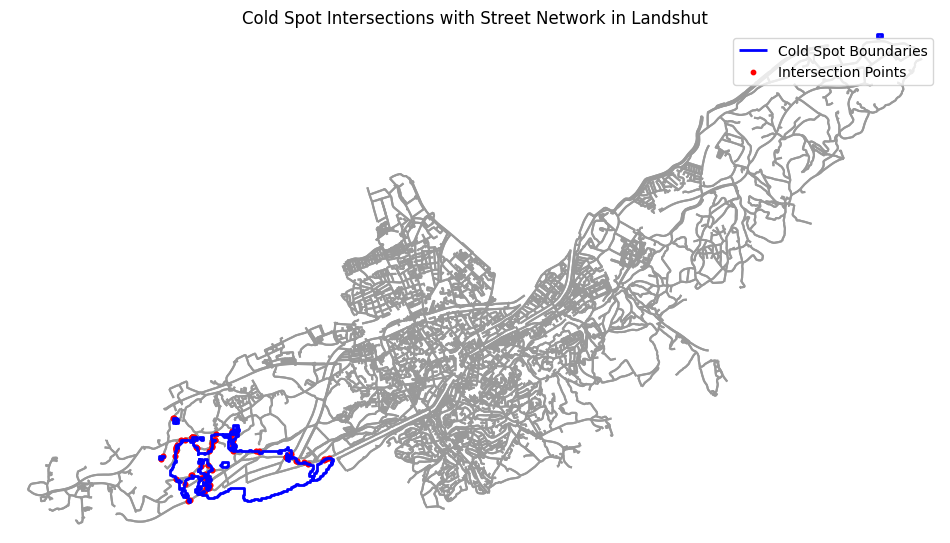

  Finished plotting for Landshut

Attempting to process city: Munich
Skipping Munich: Corresponding cold spot boundaries not found with key 'Munich'.

Attempting to process city: Nuremberg
  Accessed cold spot boundaries (Nuremberg) and street network (Nuremberg)
  Projecting graph for Nuremberg to EPSG:32632
  Finished projecting graph for Nuremberg
  Extracted and projected edges GeoDataFrame for Nuremberg
  CRS of cold spot boundaries GeoDataFrame matches edges for Nuremberg
  Finding intersections between cold spot boundaries and street network for Nuremberg...
  Finished finding intersections for Nuremberg. Found 2178 intersection points.
  Created intersection points GeoDataFrame for Nuremberg
  Plotting results for Nuremberg...


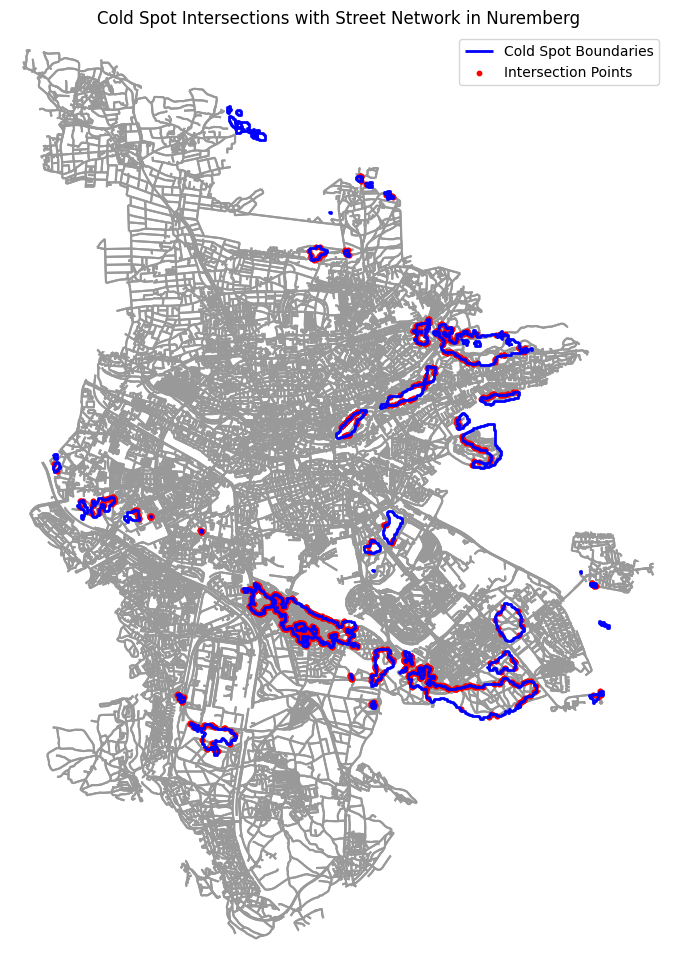

  Finished plotting for Nuremberg

Attempting to process city: Passau
  Accessed cold spot boundaries (Passau) and street network (Passau)
  Projecting graph for Passau to EPSG:32632
  Finished projecting graph for Passau
  Extracted and projected edges GeoDataFrame for Passau
  CRS of cold spot boundaries GeoDataFrame matches edges for Passau
  Finding intersections between cold spot boundaries and street network for Passau...
  Finished finding intersections for Passau. Found 166 intersection points.
  Created intersection points GeoDataFrame for Passau
  Plotting results for Passau...


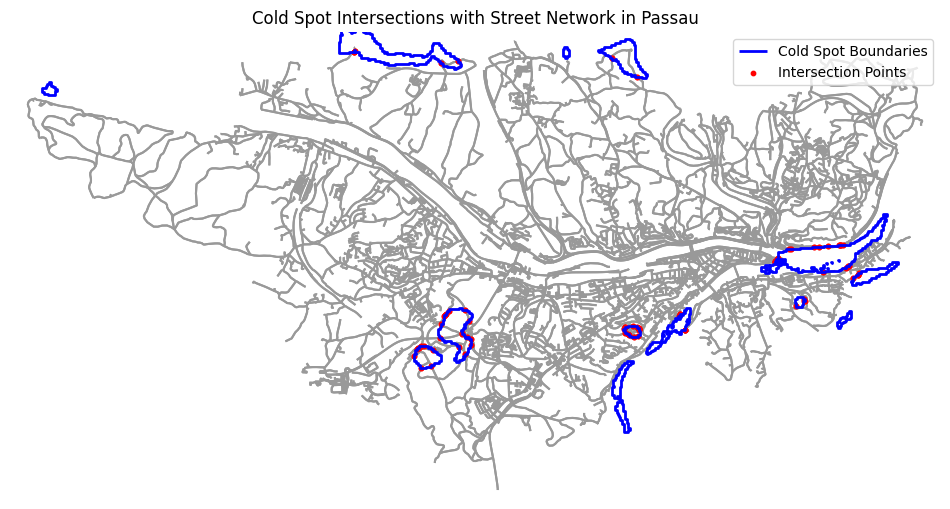

  Finished plotting for Passau

Attempting to process city: Regensburg
  Accessed cold spot boundaries (Regensburg) and street network (Regensburg)
  Projecting graph for Regensburg to EPSG:32632
  Finished projecting graph for Regensburg
  Extracted and projected edges GeoDataFrame for Regensburg
  CRS of cold spot boundaries GeoDataFrame matches edges for Regensburg
  Finding intersections between cold spot boundaries and street network for Regensburg...
  Finished finding intersections for Regensburg. Found 394 intersection points.
  Created intersection points GeoDataFrame for Regensburg
  Plotting results for Regensburg...


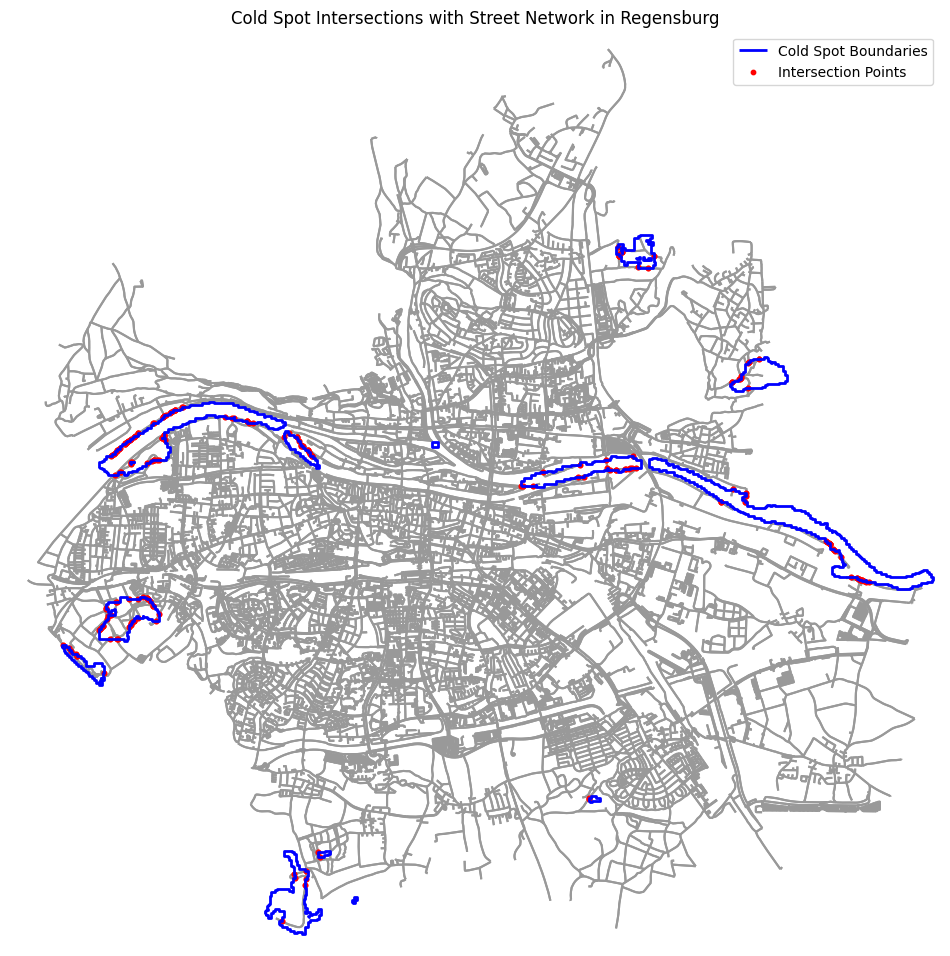

  Finished plotting for Regensburg

Attempting to process city: Rosenheim
  Accessed cold spot boundaries (Rosenheim) and street network (Rosenheim)
  Projecting graph for Rosenheim to EPSG:32632
  Finished projecting graph for Rosenheim
  Extracted and projected edges GeoDataFrame for Rosenheim
  CRS of cold spot boundaries GeoDataFrame matches edges for Rosenheim
  Finding intersections between cold spot boundaries and street network for Rosenheim...
  Finished finding intersections for Rosenheim. Found 112 intersection points.
  Created intersection points GeoDataFrame for Rosenheim
  Plotting results for Rosenheim...


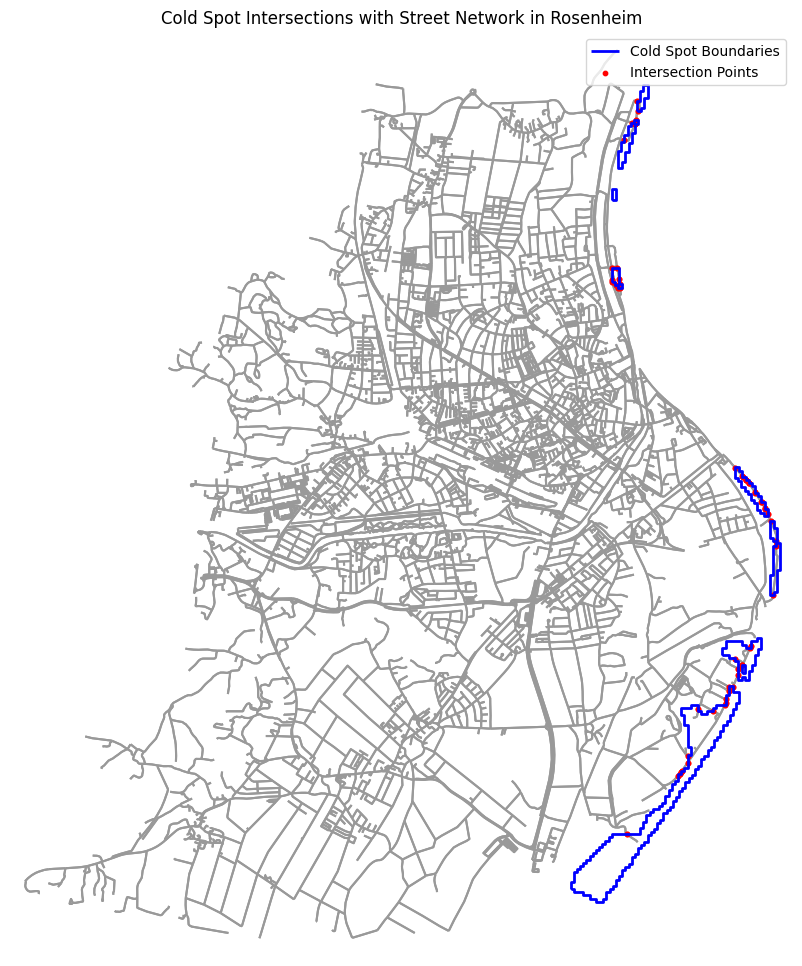

  Finished plotting for Rosenheim

Attempting to process city: Schweinfurt
  Accessed cold spot boundaries (Schweinfurt) and street network (Schweinfurt)
  Projecting graph for Schweinfurt to EPSG:32632
  Finished projecting graph for Schweinfurt
  Extracted and projected edges GeoDataFrame for Schweinfurt
  CRS of cold spot boundaries GeoDataFrame matches edges for Schweinfurt
  Finding intersections between cold spot boundaries and street network for Schweinfurt...
  Finished finding intersections for Schweinfurt. Found 438 intersection points.
  Created intersection points GeoDataFrame for Schweinfurt
  Plotting results for Schweinfurt...


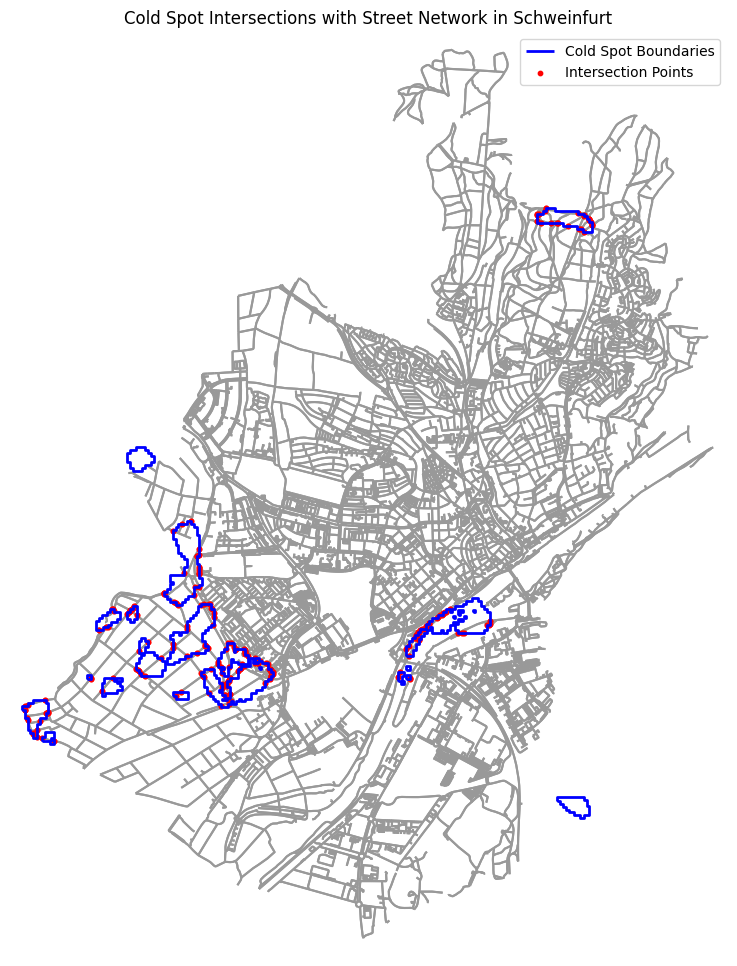

  Finished plotting for Schweinfurt

Attempting to process city: Würzburg
  Accessed cold spot boundaries (Würzburg) and street network (Würzburg)
  Projecting graph for Würzburg to EPSG:32632
  Finished projecting graph for Würzburg
  Extracted and projected edges GeoDataFrame for Würzburg
  CRS of cold spot boundaries GeoDataFrame matches edges for Würzburg
  Finding intersections between cold spot boundaries and street network for Würzburg...
  Finished finding intersections for Würzburg. Found 1066 intersection points.
  Created intersection points GeoDataFrame for Würzburg
  Plotting results for Würzburg...


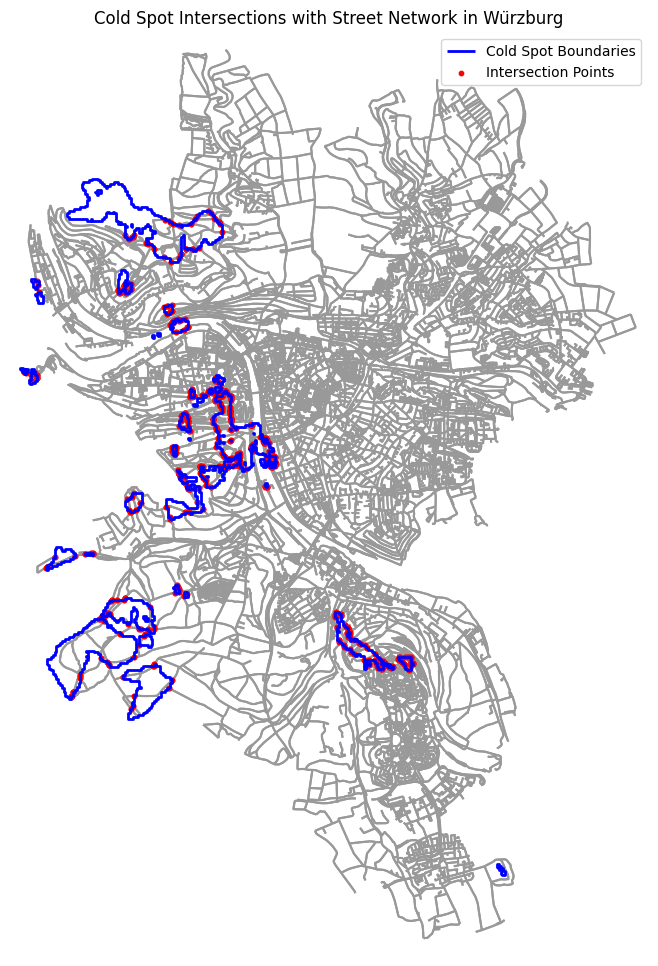

  Finished plotting for Würzburg

Finished finding and plotting intersection points for all processed cities.


In [7]:
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Dictionary to store intersection points for each city
all_intersection_points = {}

# Iterate through the keys of the graphs dictionary
print("Keys in graphs dictionary:")
print(list(graphs.keys()))
print("\nKeys in cold_spot_boundaries_2024_p010 dictionary:")
print(list(cold_spot_boundaries_2024_p010.keys()))

# Create a mapping from the keys in 'graphs' to the keys in 'cold_spot_boundaries_2024_p010'
# based on the observed output. This mapping is needed because the keys don't match exactly.
city_key_mapping = {
    'Aschaffenburg': 'Aschaffenburg',
    'Augsburg': 'Augsburg',
    'Bamberg': 'Bamberg',
    'Bayreuth': 'Bayreuth',
    'Erlangen': 'Erlangen',
    'Fürth': 'Fürth', # Mapping for Fürth with umlaut
    'Ingolstadt': 'Ingolstadt',
    'Kempten (Allgäu)': 'Kempten Allgäu', # Mapping for Kempten (Allgäu)
    'Landshut': 'Landshut',
    'Munich': 'Munich', # Munich graph exists, but no cold spot data was loaded for it.
    'Nuremberg': 'Nuremberg',
    'Passau': 'Passau',
    'Regensburg': 'Regensburg',
    'Rosenheim': 'Rosenheim',
    'Schweinfurt': 'Schweinfurt',
    'Würzburg': 'Würzburg' # Mapping for Würzburg with umlaut
}


for graph_city_name in graphs.keys():
    print(f"\nAttempting to process city: {graph_city_name}")

    # Get the corresponding key for the cold spot boundaries dictionary using the mapping
    cold_spot_key = city_key_mapping.get(graph_city_name)

    if cold_spot_key and cold_spot_key in cold_spot_boundaries_2024_p010:
        cold_spot_boundaries_gdf = cold_spot_boundaries_2024_p010[cold_spot_key]
        G = graphs[graph_city_name] # Access the graph using the correct city_name key from graphs.keys()
        print(f"  Accessed cold spot boundaries ({cold_spot_key}) and street network ({graph_city_name})")


        # --- Start of intersection finding and plotting logic (from a-8JMqOPgEOW) ---

        # Project the graph to a suitable projected CRS (e.g., UTM Zone 32N - EPSG:32632)
        # Check if the graph is already projected
        if G.graph['crs'] != 'epsg:32632':
            print(f"  Projecting graph for {graph_city_name} to EPSG:32632")
            graph_proj = ox.project_graph(G, to_crs='epsg:32632')
            print(f"  Finished projecting graph for {graph_city_name}")
        else:
            graph_proj = G
            print(f"  Graph for {graph_city_name} is already in EPSG:32632")

        # Extract the edges of the graph as a GeoDataFrame
        edges_gdf_proj = ox.graph_to_gdfs(graph_proj, nodes=False, edges=True)
        print(f"  Extracted and projected edges GeoDataFrame for {graph_city_name}")

        # Ensure cold_spots_gdf is in the same projected CRS as the edges_gdf_proj for intersection calculation
        if cold_spot_boundaries_gdf.crs != edges_gdf_proj.crs:
            print(f"  Reprojecting cold spot boundaries GeoDataFrame to match edges CRS for {graph_city_name}")
            cold_spots_gdf_proj = cold_spot_boundaries_gdf.to_crs(edges_gdf_proj.crs)
            print(f"  Finished reprojecting cold spot boundaries for {graph_city_name}")
        else:
            cold_spots_gdf_proj = cold_spot_boundaries_gdf
            print(f"  CRS of cold spot boundaries GeoDataFrame matches edges for {graph_city_name}")

        # Create a list to store the intersection points
        intersection_points = []

        # Iterate over the Cold Spot lines
        print(f"  Finding intersections between cold spot boundaries and street network for {graph_city_name}...")
        for _, cold_spot_line in cold_spots_gdf_proj.iterrows():
            # Use spatial index for faster intersection checks
            possible_matches_index = list(edges_gdf_proj.sindex.intersection(cold_spot_line['geometry'].bounds))
            possible_matches = edges_gdf_proj.iloc[possible_matches_index]

            # Iterate over the potentially intersecting edges
            for _, edge_line in possible_matches.iterrows():
                # Check if the lines intersect
                if cold_spot_line['geometry'].intersects(edge_line['geometry']):
                    # Calculate the intersection geometry
                    intersection = cold_spot_line['geometry'].intersection(edge_line['geometry'])

                    # Filter for Point or MultiPoint geometries from the intersection
                    if intersection.geom_type == 'Point':
                        intersection_points.append(intersection)
                    elif intersection.geom_type == 'MultiPoint':
                        for point in intersection.geoms:
                            intersection_points.append(point)

        print(f"  Finished finding intersections for {graph_city_name}. Found {len(intersection_points)} intersection points.")

        # Create a GeoDataFrame from the intersection points
        if intersection_points:
            intersection_gdf = gpd.GeoDataFrame(geometry=intersection_points, crs=cold_spots_gdf_proj.crs)
            print(f"  Created intersection points GeoDataFrame for {graph_city_name}")

            # --- Plotting ---
            print(f"  Plotting results for {graph_city_name}...")
            fig, ax = plt.subplots(figsize=(12, 12))

            # Plot the street network using ox.plot_graph
            ox.plot_graph(graph_proj, ax=ax, node_size=0, edge_color='#999999', edge_linewidth=1.5, show=False, close=False)

            # Plot the cold spot boundaries
            cold_spots_gdf_proj.plot(ax=ax, color='blue', linewidth=2, label='Cold Spot Boundaries')

            # Plot the intersection points
            intersection_gdf.plot(ax=ax, color='red', markersize=10, label='Intersection Points')

            ax.set_title(f"Cold Spot Intersections with Street Network in {graph_city_name}")
            ax.legend()
            plt.show()
            print(f"  Finished plotting for {graph_city_name}")

        else:
            intersection_gdf = gpd.GeoDataFrame(geometry=[], crs=cold_spots_gdf_proj.crs)
            print(f"  No intersection points found for {graph_city_name}. Skipping plotting.")
            # TODO: Implement the fallback to finding nearest node if no boundary intersections are found.
            # This will be handled in a subsequent step as per the plan.

        # Store the resulting intersection points GeoDataFrame
        all_intersection_points[graph_city_name] = intersection_gdf

        # --- End of intersection finding and plotting logic ---

    else:
        print(f"Skipping {graph_city_name}: Corresponding cold spot boundaries not found with key '{cold_spot_key}'.")


print("\nFinished finding and plotting intersection points for all processed cities.")

# The 'all_intersection_points' dictionary now contains the intersection points for each city

# Ersatzstartpunkte finden

In [8]:
# Initialize a set to store city names with intersections
cities_with_intersections = set()

# Iterate through the all_intersection_points dictionary
for city_name, intersection_gdf in all_intersection_points.items():
    # Check if the GeoDataFrame is not empty
    if not intersection_gdf.empty:
        # Add the city name to the set
        cities_with_intersections.add(city_name)

# Print the set of cities with intersections
print("Cities with successful intersection findings:")
print(cities_with_intersections)

Cities with successful intersection findings:
{'Erlangen', 'Regensburg', 'Aschaffenburg', 'Landshut', 'Bayreuth', 'Kempten (Allgäu)', 'Rosenheim', 'Passau', 'Nuremberg', 'Bamberg', 'Schweinfurt', 'Würzburg', 'Ingolstadt', 'Fürth', 'Augsburg'}


## nearest node für Polygone ohne intersection points finden

In [9]:
import osmnx as ox
import geopandas as gpd

# Initialize dictionaries to store the group_ids and the actual polygons without intersections
polygons_without_intersections_group_ids = {}
polygons_without_intersections_gdf = {}
# Initialize an empty dictionary to store the fallback nodes for each city
fallback_points = {}

# Iterate through the cities that had intersections (these are the cities for which we have both graphs and cold spot boundaries)
for city_name in cities_with_intersections:
    print(f"\nProcessing city for fallback logic: {city_name}")

    # Get the original cold spot polygons for the city from the cold_spot_polygons_2024_p010 dictionary.
    # The city_name key in cities_with_intersections comes from the graphs keys, which are mapped
    # to the cold_spot_polygons_2024_p010 keys by city_key_mapping.
    # Use the city_key_mapping to get the correct key for cold_spot_polygons_2024_p010.
    cold_spot_polygons_key = city_key_mapping.get(city_name)


    if cold_spot_polygons_key and cold_spot_polygons_key in cold_spot_polygons_2024_p010:
        original_polygons_gdf = cold_spot_polygons_2024_p010[cold_spot_polygons_key]
        print(f"  Accessed original cold spot polygons for {city_name} using key '{cold_spot_polygons_key}'")
    else:
        print(f"  Original cold spot polygons not found for key: {cold_spot_polygons_key}. Skipping fallback logic for this city.")
        continue # Skip to the next city if original polygons are not found


    # Get the intersection points for the city
    if city_name in all_intersection_points:
        intersection_gdf = all_intersection_points[city_name]
        print(f"  Accessed intersection points for {city_name}")
    else:
        print(f"  Intersection points not found for {city_name}. Skipping fallback.")
        continue # This should not happen based on the 'cities_with_intersections' set, but good for robustness.


    # Identify group_ids from the original polygons
    original_group_ids = set(original_polygons_gdf['group_id'].unique())
    print(f"  Original group_ids count for {city_name}: {len(original_group_ids)}")


    # Identify group_ids represented in the intersection points
    # Perform a spatial join between intersection points and original polygons
    # to link intersection points back to their source polygons and their group_ids.

    # Ensure both GeoDataFrames are in the same CRS before spatial join
    if original_polygons_gdf.crs != intersection_gdf.crs:
        print(f"  Reprojecting original polygons to match intersection points CRS for {city_name}")
        original_polygons_gdf_proj = original_polygons_gdf.to_crs(intersection_gdf.crs)
        print(f"  Finished reprojecting original polygons for {city_name}")
    else:
        original_polygons_gdf_proj = original_polygons_gdf
        print(f"  CRS of original polygons matches intersection points for {city_name}")


    # Perform a spatial join to find which polygon each intersection point is within
    # Use 'within' predicate to join intersection points to the polygons they are inside.
    # This join will only keep intersection points that fall within one of the original polygons.
    # Select only the 'group_id' and 'geometry' columns from the original polygons for the join
    intersection_points_with_polygon_info = gpd.sjoin(intersection_gdf, original_polygons_gdf_proj[['group_id', 'geometry']], how="inner", predicate="within")
    print(f"  Performed spatial join to link intersection points to original polygons for {city_name}")


    # Get the group_ids that have at least one intersection point
    group_ids_with_intersections = set(intersection_points_with_polygon_info['group_id'].unique())
    print(f"  Group_ids with intersections count for {city_name}: {len(group_ids_with_intersections)}")

    # Find the group_ids that do not have any intersection points
    group_ids_without_intersections = original_group_ids - group_ids_with_intersections
    print(f"  Group_ids without intersections count for {city_name}: {len(group_ids_without_intersections)}")


    # Store the group_ids without intersections
    polygons_without_intersections_group_ids[city_name] = list(group_ids_without_intersections)

    # Filter the original polygons GeoDataFrame to get the polygons without intersections
    polygons_without_intersections_gdf[city_name] = original_polygons_gdf[
        original_polygons_gdf['group_id'].isin(group_ids_without_intersections)
    ]
    print(f"  Filtered original polygons for those without intersections for {city_name}")


    # --- Start of finding fallback points for polygons without intersections ---

    # Access the street network graph for the current city from the 'graphs' dictionary.
    if city_name in graphs:
        G = graphs[city_name]
        print(f"  Accessed street network graph for {city_name} for fallback points")

        # Project the graph to the same projected CRS as the polygons without intersections.
        # The polygons_without_intersections_gdf is already in EPSG:32632.
        if G.graph['crs'] != polygons_without_intersections_gdf[city_name].crs:
            print(f"  Projecting graph for {city_name} to {polygons_without_intersections_gdf[city_name].crs} for fallback points")
            graph_proj = ox.project_graph(G, to_crs=polygons_without_intersections_gdf[city_name].crs)
            print(f"  Finished projecting graph for {city_name} for fallback points")
        else:
            graph_proj = G
            print(f"  Graph for {city_name} is already in {polygons_without_intersections_gdf[city_name].crs} for fallback points")


        # Extract the nodes of the projected graph as a GeoDataFrame
        nodes_gdf_proj = ox.graph_to_gdfs(graph_proj, nodes=True, edges=False)
        print(f"  Extracted nodes GeoDataFrame for {city_name} for fallback points")

        # Create a list to store the fallback point geometries for this city
        city_fallback_points_geometries = []
        city_fallback_group_ids = [] # To store corresponding group_ids


        # For each polygon in the current city's GeoDataFrame of polygons without intersections:
        print(f"  Finding nearest nodes for {len(polygons_without_intersections_gdf[city_name])} polygons without intersections for {city_name}...")
        for index, polygon in polygons_without_intersections_gdf[city_name].iterrows():
            # Calculate the centroid of the polygon
            polygon_centroid = polygon.geometry.centroid

            # Find the nearest node in the projected graph nodes GeoDataFrame to this centroid
            # ox.nearest_nodes returns the osmid of the nearest node
            nearest_node_osmid = ox.nearest_nodes(graph_proj, polygon_centroid.x, polygon_centroid.y)

            # Retrieve the geometry (Point) of this nearest node from the projected graph nodes GeoDataFrame
            nearest_node_geometry = nodes_gdf_proj.loc[nearest_node_osmid, 'geometry']

            # Store this nearest node geometry and its original group_id
            city_fallback_points_geometries.append(nearest_node_geometry)
            city_fallback_group_ids.append(polygon['group_id'])


        print(f"  Found {len(city_fallback_points_geometries)} fallback points for {city_name}")

        # Create a GeoDataFrame from the collected fallback node geometries.
        # Ensure it has the correct CRS.
        if city_fallback_points_geometries:
            fallback_gdf = gpd.GeoDataFrame({'group_id': city_fallback_group_ids, 'geometry': city_fallback_points_geometries}, crs=polygons_without_intersections_gdf[city_name].crs)
            print(f"  Created fallback points GeoDataFrame for {city_name}")
        else:
            fallback_gdf = gpd.GeoDataFrame(geometry=[], crs=polygons_without_intersections_gdf[city_name].crs)
            print(f"  No fallback points created for {city_name} as there were no polygons without intersections.")

        # Store this fallback points GeoDataFrame in the 'fallback_points' dictionary with the city name as the key.
        fallback_points[city_name] = fallback_gdf
        print(f"  Stored fallback points for {city_name}")

    else:
        print(f"  Street network graph not found for {city_name}. Skipping fallback point finding for this city.")


    # --- End of finding fallback points ---


print("\nFinished identifying polygons without intersections and finding fallback points for all cities with intersections.")

# The 'polygons_without_intersections_group_ids' and 'polygons_without_intersections_gdf'
# dictionaries contain information about polygons without intersections.
# The 'fallback_points' dictionary now contains a GeoDataFrame of fallback nodes
# for each city where polygons lacked intersections.


Processing city for fallback logic: Erlangen
  Accessed original cold spot polygons for Erlangen using key 'Erlangen'
  Accessed intersection points for Erlangen
  Original group_ids count for Erlangen: 43
  CRS of original polygons matches intersection points for Erlangen
  Performed spatial join to link intersection points to original polygons for Erlangen
  Group_ids with intersections count for Erlangen: 0
  Group_ids without intersections count for Erlangen: 43
  Filtered original polygons for those without intersections for Erlangen
  Accessed street network graph for Erlangen for fallback points
  Projecting graph for Erlangen to EPSG:32632 for fallback points
  Finished projecting graph for Erlangen for fallback points
  Extracted nodes GeoDataFrame for Erlangen for fallback points
  Finding nearest nodes for 43 polygons without intersections for Erlangen...
  Found 43 fallback points for Erlangen
  Created fallback points GeoDataFrame for Erlangen
  Stored fallback points for

##Intersection und Fallback-Punkte kombinieren

In [10]:
import geopandas as gpd
import pandas as pd # Import pandas

# Dictionary to store the combined intersection and fallback points for each city
all_starting_points = {}

# Iterate through all cities for which we have graph data (since these are the cities we are processing)
for city_name in graphs.keys():
    print(f"\nCombining starting points for city: {city_name}")

    # Initialize empty GeoDataFrames with the expected CRS
    # The CRS should be consistent, using EPSG:32632 as used in previous steps
    intersection_gdf = gpd.GeoDataFrame(geometry=[], crs='epsg:32632')
    fallback_gdf = gpd.GeoDataFrame(geometry=[], crs='epsg:32632')


    # Get the intersection points for the city, if they exist
    # Check if the city_name is a key in all_intersection_points and if the gdf is not empty
    if city_name in all_intersection_points and not all_intersection_points[city_name].empty:
        intersection_gdf = all_intersection_points[city_name]
        print(f"  Found {len(intersection_gdf)} boundary intersection points for {city_name}")
        # Ensure intersection_gdf has the correct CRS before combining
        if intersection_gdf.crs != 'epsg:32632':
             intersection_gdf = intersection_gdf.to_crs('epsg:32632')
             print(f"  Reprojected intersection points for {city_name} to EPSG:32632")
    else:
        print(f"  No boundary intersection points found for {city_name} or city not in all_intersection_points.")

    # Get the fallback points for the city, if they exist
    # Check if the city_name is a key in fallback_points and if the gdf is not empty
    if city_name in fallback_points and not fallback_points[city_name].empty:
        fallback_gdf = fallback_points[city_name]
        print(f"  Found {len(fallback_gdf)} fallback points for {city_name}")
        # Ensure fallback_gdf has the correct CRS before combining
        if fallback_gdf.crs != 'epsg:32632':
            fallback_gdf = fallback_gdf.to_crs('epsg:32632')
            print(f"  Reprojected fallback points for {city_name} to EPSG:32632")
    else:
         print(f"  No fallback points found for {city_name} or city not in fallback_points.")


    # Combine the intersection points and fallback points using pandas.concat
    # Use ignore_index=True to reset the index after concatenation
    # Ensure both dataframes have the same columns if necessary, or handle potential column mismatches
    # For now, assuming geometry is the primary column, concat should work.
    combined_gdf = pd.concat([intersection_gdf, fallback_gdf], ignore_index=True)


    if not combined_gdf.empty:
        all_starting_points[city_name] = combined_gdf
        print(f"  Created combined GeoDataFrame for {city_name} with {len(combined_gdf)} starting points.")
    else:
        print(f"  No starting points found (neither intersections nor fallback) for {city_name}. Skipping.")


print("\nFinished combining intersection and fallback points for all cities.")

# The 'all_starting_points' dictionary now contains a GeoDataFrame for each city
# with all identified starting points for accessibility analysis.


Combining starting points for city: Aschaffenburg
  Found 98 boundary intersection points for Aschaffenburg
  Found 6 fallback points for Aschaffenburg
  Created combined GeoDataFrame for Aschaffenburg with 104 starting points.

Combining starting points for city: Augsburg
  Found 394 boundary intersection points for Augsburg
  Found 26 fallback points for Augsburg
  Created combined GeoDataFrame for Augsburg with 420 starting points.

Combining starting points for city: Bamberg
  Found 174 boundary intersection points for Bamberg
  Found 21 fallback points for Bamberg
  Created combined GeoDataFrame for Bamberg with 195 starting points.

Combining starting points for city: Bayreuth
  Found 136 boundary intersection points for Bayreuth
  Found 15 fallback points for Bayreuth
  Created combined GeoDataFrame for Bayreuth with 151 starting points.

Combining starting points for city: Erlangen
  Found 422 boundary intersection points for Erlangen
  Found 43 fallback points for Erlangen
  

# Startpunkte reduzieren

In [11]:
import geopandas as gpd
import pandas as pd # Ensure pandas is imported
from scipy.spatial import ConvexHull
import numpy as np

# Dictionary to store the original starting points with their assigned cluster_id
starting_points_with_clusters = {}

print("Identifying clusters of very close starting points and linking original points...")

# Iterate through each city and its combined starting points GeoDataFrame
for city_name, starting_points_gdf in all_starting_points.items():
    print(f"\nProcessing city for clustering and linking: {city_name}")

    if not starting_points_gdf.empty:
        # Ensure the GeoDataFrame is in a projected CRS for accurate buffering
        # all_starting_points are already in EPSG:32632 from previous steps
        if starting_points_gdf.crs != 'epsg:32632':
            print(f"  Reprojecting starting points for {city_name} to EPSG:32632 for buffering.")
            starting_points_gdf_proj = starting_points_gdf.to_crs('epsg:32632')
            print(f"  Finished reprojecting starting points for {city_name}.")
        else:
            starting_points_gdf_proj = starting_points_gdf
            print(f"  Starting points for {city_name} are already in EPSG:32632.")

        # Define a small buffer distance in the projected CRS (meters) to identify very close points
        buffer_distance = 1.0  # meters - adjust based on the expected precision of points

        # Apply a small buffer around each point
        print(f"  Applying a {buffer_distance} meter buffer around starting points...")
        buffered_points = starting_points_gdf_proj.copy()
        buffered_points['geometry'] = buffered_points.geometry.buffer(buffer_distance)
        print(f"  Finished buffering starting points.")

        # Dissolve overlapping buffers to form clusters of close points
        print(f"  Dissolving overlapping buffers...")
        # Dissolve without 'by' to group any overlapping buffers, regardless of original group_id
        dissolved_clusters = buffered_points.dissolve()
        print(f"  Finished dissolving buffers.")

        # Explode multi-part polygons resulting from dissolve into single-part polygons
        exploded_clusters = dissolved_clusters.explode(index_parts=True)
        print(f"  Exploded multi-part polygons.")

        # Assign a unique cluster_id to each resulting polygon (cluster)
        exploded_clusters['cluster_id'] = range(len(exploded_clusters))
        print(f"  Assigned cluster_ids to {len(exploded_clusters)} clusters.")

        # --- Link original starting points to their clusters ---
        print(f"  Linking original starting points to their clusters for {city_name}...")

        if not exploded_clusters.empty:
            # Ensure both GeoDataFrames are in the same projected CRS before spatial join
            # Both should be in EPSG:32632
            if starting_points_gdf_proj.crs != exploded_clusters.crs:
                 # This case should ideally not happen if CRS handling was consistent
                 print(f"  Warning: CRS mismatch between projected points and clusters for {city_name}. Reprojecting points.")
                 starting_points_gdf_proj = starting_points_gdf_proj.to_crs(exploded_clusters.crs)


            # Perform a spatial join to add the 'cluster_id' from the polygons to the points
            # Use 'within' predicate to find which polygon each point is inside
            # Select only the 'cluster_id' and 'geometry' columns from the clusters for the join
            points_with_clusters = gpd.sjoin(starting_points_gdf_proj, exploded_clusters[['cluster_id', 'geometry']], how="inner", predicate="within")
            print(f"  Performed spatial join to link points to clusters for {city_name}.")

            # Store the resulting GeoDataFrame with 'group_id' and 'cluster_id'
            starting_points_with_clusters[city_name] = points_with_clusters
            print(f"  Stored starting points with cluster IDs for {city_name}. Resulting shape: {points_with_clusters.shape}")

        else:
            print(f"  No clusters found for {city_name}. Cannot link original points to clusters.")
            # Store an empty GeoDataFrame for this city
            starting_points_with_clusters[city_name] = gpd.GeoDataFrame(geometry=[], crs=starting_points_gdf_proj.crs)


    else:
        print(f"  No starting points found for {city_name}. Skipping clustering and linking.")
        # Store an empty GeoDataFrame for this city
        starting_points_with_clusters[city_name] = gpd.GeoDataFrame(geometry=[], crs='epsg:32632')


print("\nFinished identifying clusters and linking original starting points for all cities.")

# The 'starting_points_with_clusters' dictionary now contains GeoDataFrames for each city,
# where each original starting point has been assigned a 'cluster_id' based on the spatial clustering.
# It also retains the original 'group_id'.

Identifying clusters of very close starting points and linking original points...

Processing city for clustering and linking: Aschaffenburg
  Starting points for Aschaffenburg are already in EPSG:32632.
  Applying a 1.0 meter buffer around starting points...
  Finished buffering starting points.
  Dissolving overlapping buffers...
  Finished dissolving buffers.
  Exploded multi-part polygons.
  Assigned cluster_ids to 52 clusters.
  Linking original starting points to their clusters for Aschaffenburg...
  Performed spatial join to link points to clusters for Aschaffenburg.
  Stored starting points with cluster IDs for Aschaffenburg. Resulting shape: (104, 5)

Processing city for clustering and linking: Augsburg
  Starting points for Augsburg are already in EPSG:32632.
  Applying a 1.0 meter buffer around starting points...
  Finished buffering starting points.
  Dissolving overlapping buffers...
  Finished dissolving buffers.
  Exploded multi-part polygons.
  Assigned cluster_ids to 2

In [12]:
from scipy.spatial import ConvexHull
import numpy as np
import pandas as pd # Ensure pandas is imported for pd.concat
import geopandas as gpd # Ensure geopandas is imported

# Dictionary to store the reduced set of starting points for each city
# Use the existing dictionary to continue from the failed state if possible
reduced_starting_points = {} # Initialize the dictionary here

print("Reducing the number of starting points based on clustering (fix applied)...")

# Iterate through each city in the starting_points_with_clusters dictionary
for city_name, points_gdf in starting_points_with_clusters.items():
    print(f"\nProcessing city for starting point reduction: {city_name}")

    if not points_gdf.empty:
        # Get the unique cluster_ids for the current city
        unique_cluster_ids = points_gdf['cluster_id'].unique()
        print(f"  Found {len(unique_cluster_ids)} unique clusters for {city_name}.")

        # List to store the selected points for the current city
        selected_points_list = []

        # Process each cluster
        for cluster_id in unique_cluster_ids:
            # Filter the points belonging to the current cluster
            cluster_points_gdf = points_gdf[points_gdf['cluster_id'] == cluster_id].copy() # Use .copy() to avoid SettingWithCopyWarning

            # If the cluster has only one point, select it
            if len(cluster_points_gdf) == 1:
                selected_points_list.append(cluster_points_gdf)
                # print(f"    Cluster {cluster_id}: 1 point, selected the point.") # Optional debug
                continue

            # For multi-point clusters
            if len(cluster_points_gdf) < 3:
                # If 2 points, treat as linear and select both (or maybe just one if really close?)
                # For simplicity and safety with very close points, let's select just the first one for now
                # Or, if linear selection is desired for 2 points, sort and take the first.
                # Let's sort by x and take the first for simplicity with 2 points.
                sorted_cluster_points = cluster_points_gdf.sort_values(by='geometry', key=lambda geom: geom.apply(lambda p: p.x))
                selected_points_list.append(sorted_cluster_points.iloc[[0]]) # Select only the first point
                # print(f"    Cluster {cluster_id}: {len(cluster_points_gdf)} points (<3), selected the first point after sorting by x.") # Optional debug
                continue

            # If 3 or more points, check for linear arrangement using Convex Hull
            try:
                # Extract point coordinates as a list of lists or a numpy array
                points_coords = cluster_points_gdf['geometry'].apply(lambda p: [p.x, p.y]).tolist()
                hull = ConvexHull(points_coords)
                hull_points = hull.points[hull.vertices]

                # Calculate bounding box dimensions
                min_x, min_y = np.min(hull_points, axis=0)
                max_x, max_y = np.max(hull_points, axis=0)
                width = max_x - min_x
                height = max_y - min_y

                # Avoid division by zero
                if min(width, height) > 1e-6: # Use a small tolerance instead of 0
                    aspect_ratio = max(width, height) / min(width, height)
                else:
                    aspect_ratio = float('inf') # Treat as perfectly linear if one dimension is very small

                # If aspect ratio is high, assume linear arrangement
                if aspect_ratio > 5: # Threshold for linearity (can be adjusted)
                    # Select every second point along the major axis
                    # Determine major axis by comparing width and height
                    if width > height:
                        # Sort by x-coordinate
                        sorted_cluster_points = cluster_points_gdf.sort_values(by='geometry', key=lambda geom: geom.apply(lambda p: p.x))
                    else:
                        # Sort by y-coordinate
                        sorted_cluster_points = cluster_points_gdf.sort_values(by='geometry', key=lambda geom: geom.apply(lambda p: p.y))

                    selected_points_list.append(sorted_cluster_points.iloc[::2])
                    # print(f"    Cluster {cluster_id}: {len(cluster_points_gdf)} points (>=3), linear arrangement (aspect ratio > 5), selected every second point.") # Optional debug
                else:
                    # For non-linear clusters, select point closest to centroid
                    cluster_centroid = cluster_points_gdf.unary_union.centroid
                    # Find the index of the point closest to the centroid
                    closest_point_index = cluster_points_gdf.distance(cluster_centroid).argmin()
                    closest_point = cluster_points_gdf.iloc[[closest_point_index]]
                    selected_points_list.append(closest_point)
                    # print(f"    Cluster {cluster_id}: {len(cluster_points_gdf)} points (>=3), non-linear arrangement, selected point closest to centroid.") # Optional debug

            except Exception as e:
                # Fallback for any other errors during Convex Hull calculation
                print(f"    Error processing cluster {cluster_id} for {city_name}: {e}. Falling back to selecting the first point.")
                # Fallback to selecting the first point in the cluster
                selected_points_list.append(cluster_points_gdf.iloc[[0]])


        # Combine all selected points for the city into a single GeoDataFrame
        if selected_points_list:
            # Concatenate the list of GeoDataFrames
            reduced_gdf = gpd.GeoDataFrame(pd.concat(selected_points_list, ignore_index=True), crs=points_gdf.crs)

            # Ensure the 'group_id' column is present and handle potential NaN values from original points
            # If 'group_id' was not in the original 'points_gdf' for some reason, add it.
            if 'group_id' not in reduced_gdf.columns:
                 # This case should ideally not happen if all_starting_points had group_id
                 # As a fallback, you might need to re-join with original cold spot polygons based on spatial location
                 # For now, let's assume group_id is present from the concat.
                 pass # group_id should be present from the concatenated GeoDataFrames

            reduced_starting_points[city_name] = reduced_gdf
            print(f"  Finished reduction for {city_name}. Reduced from {len(points_gdf)} to {len(reduced_gdf)} points.")
        else:
            print(f"  No points selected for {city_name} after reduction process.")


    else:
        print(f"  No starting points with clusters found for {city_name}. Skipping reduction.")

print("\nFinished reducing starting points for all cities.")

# The 'reduced_starting_points' dictionary now contains a GeoDataFrame for each city
# with the reduced set of starting points.

Reducing the number of starting points based on clustering (fix applied)...

Processing city for starting point reduction: Aschaffenburg
  Found 52 unique clusters for Aschaffenburg.
    Error processing cluster 9 for Aschaffenburg: QH6154 Qhull precision error: Initial simplex is flat (facet 1 is coplanar with the interior point)

While executing:  | qhull i Qt
Options selected for Qhull 2020.2.r 2020/08/31:
  run-id 121986118  incidence  Qtriangulate  _pre-merge  _zero-centrum
  _max-width 0.34  Error-roundoff 3.9e-09  _one-merge 2e-08
  _near-inside 9.9e-08  Visible-distance 7.9e-09  U-max-coplanar 7.9e-09
  Width-outside 1.6e-08  _wide-facet 4.7e-08  _maxoutside 2.4e-08

The input to qhull appears to be less than 2 dimensional, or a
computation has overflowed.

Qhull could not construct a clearly convex simplex from points:
- p2(v3): 5.1e+05 5.5e+06
- p0(v2): 5.1e+05 5.5e+06
- p1(v1): 5.1e+05 5.5e+06

The center point is coplanar with a facet, or a vertex is coplanar
with a neighbo

/tmp/ipython-input-12-3153530801.py:80: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  cluster_centroid = cluster_points_gdf.unary_union.centroid


    Error processing cluster 700 for Nuremberg: QH6154 Qhull precision error: Initial simplex is flat (facet 1 is coplanar with the interior point)

While executing:  | qhull i Qt
Options selected for Qhull 2020.2.r 2020/08/31:
  run-id 122019732  incidence  Qtriangulate  _pre-merge  _zero-centrum
  _max-width 0.8  Error-roundoff 4e-09  _one-merge 2e-08  _near-inside 9.9e-08
  Visible-distance 7.9e-09  U-max-coplanar 7.9e-09  Width-outside 1.6e-08
  _wide-facet 4.8e-08  _maxoutside 2.4e-08

The input to qhull appears to be less than 2 dimensional, or a
computation has overflowed.

Qhull could not construct a clearly convex simplex from points:
- p1(v3): 6.5e+05 5.5e+06
- p0(v2): 6.5e+05 5.5e+06
- p2(v1): 6.5e+05 5.5e+06

The center point is coplanar with a facet, or a vertex is coplanar
with a neighboring facet.  The maximum round off error for
computing distances is 4e-09.  The center point, facets and distances
to the center point are as follows:

center point 6.542e+05 5.474e+06

fa

/tmp/ipython-input-12-3153530801.py:80: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  cluster_centroid = cluster_points_gdf.unary_union.centroid


    Error processing cluster 357 for Würzburg: QH6013 qhull input error: input is less than 2-dimensional since all points have the same x coordinate 5.664e+05

While executing:  | qhull i Qt
Options selected for Qhull 2020.2.r 2020/08/31:
  run-id 122036539  incidence  Qtriangulate  _pre-merge  _zero-centrum
  _max-width 2.1  Error-roundoff 4e-09  _one-merge 2e-08  _near-inside 9.9e-08
  Visible-distance 7.9e-09  U-max-coplanar 7.9e-09  Width-outside 1.6e-08
  _wide-facet 4.7e-08  _maxoutside 2.4e-08
. Falling back to selecting the first point.
    Error processing cluster 310 for Würzburg: QH6154 Qhull precision error: Initial simplex is flat (facet 1 is coplanar with the interior point)

While executing:  | qhull i Qt
Options selected for Qhull 2020.2.r 2020/08/31:
  run-id 122036539  incidence  Qtriangulate  _pre-merge  _zero-centrum
  _max-width 1.5  Error-roundoff 4e-09  _one-merge 2e-08  _near-inside 9.9e-08
  Visible-distance 7.9e-09  U-max-coplanar 7.9e-09  Width-outside 1.6

/tmp/ipython-input-12-3153530801.py:80: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  cluster_centroid = cluster_points_gdf.unary_union.centroid


In [13]:
import os

# Define the directory to save the shapefiles
output_dir = '/content/reduced_starting_points'

# Create the output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created output directory: {output_dir}")

print("\nSaving reduced starting points as shapefiles...")

# Iterate through each city and its reduced starting points GeoDataFrame
for city_name, reduced_points_gdf in reduced_starting_points.items():
    print(f"Saving reduced starting points for {city_name}...")

    if not reduced_points_gdf.empty:
        # Define the output file path
        # Replace spaces and special characters in city names for valid filenames
        safe_city_name = city_name.replace(" ", "_").replace("(", "").replace(")", "").replace("̈", "e")
        output_filename = f"{safe_city_name}_reduced_starting_points.shp"
        output_filepath = os.path.join(output_dir, output_filename)

        try:
            # Save the GeoDataFrame to a shapefile
            # Ensure the CRS is set correctly before saving
            if reduced_points_gdf.crs is None:
                 print(f"  Warning: CRS not set for {city_name}. Assuming EPSG:32632 for saving.")
                 reduced_points_gdf.set_crs('epsg:32632', inplace=True)

            reduced_points_gdf.to_file(output_filepath, driver='ESRI Shapefile')
            print(f"  Successfully saved {city_name} to {output_filepath}")
        except Exception as e:
            print(f"  Error saving {city_name} to shapefile: {e}")
    else:
        print(f"  No reduced starting points found for {city_name}. Skipping save.")

print("\nFinished saving reduced starting points.")

/tmp/ipython-input-13-3036742571.py:31: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  reduced_points_gdf.to_file(output_filepath, driver='ESRI Shapefile')
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'index_right0' to 'index_righ'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'index_right1' to 'index_ri_1'
  ogr_write(
/tmp/ipython-input-13-3036742571.py:31: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  reduced_points_gdf.to_file(output_filepath, driver='ESRI Shapefile')
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'index_right0' to 'index_righ'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'index_rig

Created output directory: /content/reduced_starting_points

Saving reduced starting points as shapefiles...
Saving reduced starting points for Aschaffenburg...
  Successfully saved Aschaffenburg to /content/reduced_starting_points/Aschaffenburg_reduced_starting_points.shp
Saving reduced starting points for Augsburg...
  Successfully saved Augsburg to /content/reduced_starting_points/Augsburg_reduced_starting_points.shp
Saving reduced starting points for Bamberg...
  Successfully saved Bamberg to /content/reduced_starting_points/Bamberg_reduced_starting_points.shp
Saving reduced starting points for Bayreuth...
  Successfully saved Bayreuth to /content/reduced_starting_points/Bayreuth_reduced_starting_points.shp
Saving reduced starting points for Erlangen...
  Successfully saved Erlangen to /content/reduced_starting_points/Erlangen_reduced_starting_points.shp
Saving reduced starting points for Fürth...
  Successfully saved Fürth to /content/reduced_starting_points/Fuerth_reduced_starti

/tmp/ipython-input-13-3036742571.py:31: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  reduced_points_gdf.to_file(output_filepath, driver='ESRI Shapefile')
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'index_right0' to 'index_righ'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'index_right1' to 'index_ri_1'
  ogr_write(
/tmp/ipython-input-13-3036742571.py:31: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  reduced_points_gdf.to_file(output_filepath, driver='ESRI Shapefile')
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'index_right0' to 'index_righ'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'index_rig

# Erreichbarkeitsanalyse

In [14]:
# Define walking speed in meters per second
travel_speed = 1 # m/s

# Define travel times in minutes
travel_times_minutes = [5, 10, 15, 20, 25]

print(f"Walking speed: {travel_speed} m/s")
print(f"Travel times in minutes: {travel_times_minutes}")

Walking speed: 1 m/s
Travel times in minutes: [5, 10, 15, 20, 25]


In [17]:
import networkx as nx

# Iterate through the graphs dictionary
for city_name, G in graphs.items():
    print(f"Calculating travel times for edges in {city_name} graph...")

    # Calculate travel time for each edge
    # Ensure the graph has the 'length' attribute for edges
    if all('length' in G.edges[u, v, k] for u, v, k in G.edges):
        # Add 'travel_time' attribute (in seconds) to each edge
        for u, v, k, data in G.edges(keys=True, data=True):
            data['travel_time'] = data['length'] / travel_speed
        print(f"  Added 'travel_time' attribute to edges in {city_name} graph.")
    else:
        print(f"  Warning: 'length' attribute not found on all edges in {city_name} graph. Skipping travel time calculation for this graph.")

print("\nFinished calculating travel times for edges in all graphs.")

# You can inspect the edges of a graph to see the new attribute
# For example: list(graphs['Nuremberg'].edges(data=True))[0]

Calculating travel times for edges in Aschaffenburg graph...
  Added 'travel_time' attribute to edges in Aschaffenburg graph.
Calculating travel times for edges in Augsburg graph...
  Added 'travel_time' attribute to edges in Augsburg graph.
Calculating travel times for edges in Bamberg graph...
  Added 'travel_time' attribute to edges in Bamberg graph.
Calculating travel times for edges in Bayreuth graph...
  Added 'travel_time' attribute to edges in Bayreuth graph.
Calculating travel times for edges in Erlangen graph...
  Added 'travel_time' attribute to edges in Erlangen graph.
Calculating travel times for edges in Fürth graph...
  Added 'travel_time' attribute to edges in Fürth graph.
Calculating travel times for edges in Ingolstadt graph...
  Added 'travel_time' attribute to edges in Ingolstadt graph.
Calculating travel times for edges in Kempten (Allgäu) graph...
  Added 'travel_time' attribute to edges in Kempten (Allgäu) graph.
Calculating travel times for edges in Landshut

## Service Area Analyse (erreichbare nodes und edges) mit reduzierten Startpunkten

In [20]:
import networkx as nx

# Dictionary to store reachable nodes and edges for each city, group_id, and travel time
reachable_areas_all_cities = {}

# Convert travel times from minutes to seconds
travel_times_seconds = [t * 60 for t in travel_times_minutes]

# Iterate through each city in the reduced_starting_points dictionary
for city_name, reduced_points_gdf in reduced_starting_points.items():
    # Corrected the condition to skip only "Nuremberg" and "Munich"
    if city_name in ["Nuremberg", "Munich", "Würzburg"]: # Added "Würzburg" to the skip list
        print(f"\nSkipping city: {city_name}")
        continue

    print(f"\nCalculating reachable nodes and edges for city: {city_name}")

    # Initialize dictionary for the current city
    reachable_areas_all_cities[city_name] = {}

    # Access the street network graph for the current city
    if city_name in graphs:
        G = graphs[city_name]
        # print(f"  Accessed street network graph for {city_name}") # Removed detailed print

        # Project the graph to the same CRS as the starting points (EPSG:32632)
        # Ensure the graph is projected before finding nearest nodes and calculating paths
        if G.graph['crs'] != reduced_points_gdf.crs:
            print(f"  Projecting graph for {city_name} to {reduced_points_gdf.crs}")
            graph_proj = ox.project_graph(G, to_crs=reduced_points_gdf.crs)
            print(f"  Finished projecting graph for {city_name}")
        else:
            graph_proj = G
            # print(f"  Graph for {city_name} is already in {reduced_points_gdf.crs}") # Removed detailed print

        # Iterate through each starting point in the city's GeoDataFrame
        print(f"  Processing {len(reduced_points_gdf)} reduced starting points for {city_name}...")
        for index, starting_point in reduced_points_gdf.iterrows():
            # Get the group_id for this starting point
            group_id = starting_point.get('group_id', 'unknown_group') # Use .get() with a default for safety

            # Initialize dictionary for the current group_id within the city if it doesn't exist
            if group_id not in reachable_areas_all_cities[city_name]:
                 reachable_areas_all_cities[city_name][group_id] = {}

            # Initialize another nested dictionary for the current starting point's index
            if index not in reachable_areas_all_cities[city_name][group_id]:
                reachable_areas_all_cities[city_name][group_id][index] = {}

            # Find the nearest node in the projected graph to the starting point's geometry
            try:
                nearest_node_osmid = ox.nearest_nodes(graph_proj, starting_point.geometry.x, starting_point.geometry.y)
            except Exception as e:
                print(f"      Could not find nearest node for starting point index {index} (group_id: {group_id}): {e}. Skipping this point.")
                continue

            # For each travel time:
            for travel_time_sec, travel_time_min in zip(travel_times_seconds, travel_times_minutes):
                # print(f"      Calculating reachable nodes for {travel_time_min} minutes for starting point index {index}, group_id {group_id}...") # Removed detailed print
                try:
                    distances, _ = nx.single_source_dijkstra(graph_proj, source=nearest_node_osmid, cutoff=travel_time_sec, weight='travel_time')
                    reachable_nodes_osmid = set(distances.keys())

                    edges_proj_list = list(graph_proj.edges(keys=True, data=True))
                    reachable_edges = []
                    for u, v, k, data in edges_proj_list:
                         if u in reachable_nodes_osmid and v in reachable_nodes_osmid:
                              reachable_edges.append((u, v, k, data))

                    reachable_areas_all_cities[city_name][group_id][index][travel_time_min] = {
                        'reachable_nodes_osmid': reachable_nodes_osmid,
                        'reachable_edges': reachable_edges
                    }
                except Exception as e:
                    print(f"      Could not calculate reachable nodes/edges for {travel_time_min} minutes for starting point index {index}, group_id {group_id}: {e}. Skipping this travel time for this point.")
                    reachable_areas_all_cities[city_name][group_id][index][travel_time_min] = {
                        'reachable_nodes_osmid': set(),
                        'reachable_edges': []
                    }
    else:
        print(f"  Street network graph not found for {city_name}. Skipping reachable area calculation.")

print("\nFinished calculating reachable nodes and edges for all cities.")


Calculating reachable nodes and edges for city: Aschaffenburg
  Projecting graph for Aschaffenburg to EPSG:32632
  Finished projecting graph for Aschaffenburg
  Processing 52 reduced starting points for Aschaffenburg...

Calculating reachable nodes and edges for city: Augsburg
  Projecting graph for Augsburg to EPSG:32632
  Finished projecting graph for Augsburg
  Processing 218 reduced starting points for Augsburg...

Calculating reachable nodes and edges for city: Bamberg
  Projecting graph for Bamberg to EPSG:32632
  Finished projecting graph for Bamberg
  Processing 103 reduced starting points for Bamberg...

Calculating reachable nodes and edges for city: Bayreuth
  Projecting graph for Bayreuth to EPSG:32632
  Finished projecting graph for Bayreuth
  Processing 82 reduced starting points for Bayreuth...

Calculating reachable nodes and edges for city: Erlangen
  Projecting graph for Erlangen to EPSG:32632
  Finished projecting graph for Erlangen
  Processing 243 reduced starting

## erreichbare nodes und edges nach group_id gruppieren

**Reasoning**:
Iterate through the reachable nodes/edges for each city (excluding Nuremberg), organize the reachable edges by group_id and travel time for aggregation.

In [23]:
import geopandas as gpd
from shapely.geometry import LineString

# Dictionary to store reachable edge geometries grouped by group_id and travel time for all cities (except Nuremberg)
grouped_reachable_edges_geom_all_cities = {}

# Iterate through each city in the reachable_areas_all_cities dictionary
for city_name, city_reachable_areas in reachable_areas_all_cities.items():
    print(f"\nGrouping reachable edges by group_id for {city_name}...")

    # Initialize dictionary for the current city in the grouped results
    grouped_reachable_edges_geom_all_cities[city_name] = {}

    # Iterate through each group_id in the city's reachable areas
    for group_id, group_data in city_reachable_areas.items():
        # print(f"  Processing group_id: {group_id}") # Optional debug print

        # Initialize dictionary for the current group_id within the city
        grouped_reachable_edges_geom_all_cities[city_name][group_id] = {}

        # Iterate through each starting point index within the group_id
        for starting_point_index, travel_time_data in group_data.items():
             # Iterate through each travel time for the starting point
             for travel_time_min, reachable_data in travel_time_data.items():
                 # print(f"    Processing {travel_time_min} minutes for starting point index {starting_point_index}...") # Optional debug print

                 reachable_edges = reachable_data['reachable_edges']

                 # If this is the first time encountering this travel time for this group_id, initialize the list
                 if travel_time_min not in grouped_reachable_edges_geom_all_cities[city_name][group_id]:
                      grouped_reachable_edges_geom_all_cities[city_name][group_id][travel_time_min] = []

                 # Append the geometries of the reachable edges
                 # Each item in reachable_edges is a tuple (u, v, k, data)
                 for u, v, k, data in reachable_edges:
                      if 'geometry' in data:
                           grouped_reachable_edges_geom_all_cities[city_name][group_id][travel_time_min].append(data['geometry'])
                      else:
                           # If geometry is not directly available, handle as needed (e.g., reconstruct from node geometries)
                           pass


    print(f"Finished grouping reachable edge geometries by group_id and travel time for {city_name}.")

print("\nFinished grouping reachable edge geometries for all cities (excluding Nuremberg).")

# The 'grouped_reachable_edges_geom_all_cities' dictionary now contains reachable edge geometries,
# structured as: grouped_reachable_edges_geom_all_cities[city_name][group_id][travel_time_min] = [list of geometries]


Grouping reachable edges by group_id for Aschaffenburg...
Finished grouping reachable edge geometries by group_id and travel time for Aschaffenburg.

Grouping reachable edges by group_id for Augsburg...
Finished grouping reachable edge geometries by group_id and travel time for Augsburg.

Grouping reachable edges by group_id for Bamberg...
Finished grouping reachable edge geometries by group_id and travel time for Bamberg.

Grouping reachable edges by group_id for Bayreuth...
Finished grouping reachable edge geometries by group_id and travel time for Bayreuth.

Grouping reachable edges by group_id for Erlangen...
Finished grouping reachable edge geometries by group_id and travel time for Erlangen.

Grouping reachable edges by group_id for Fürth...
Finished grouping reachable edge geometries by group_id and travel time for Fürth.

Grouping reachable edges by group_id for Ingolstadt...
Finished grouping reachable edge geometries by group_id and travel time for Ingolstadt.

Grouping re

In [22]:
# Dictionary to store reachable nodes and edges aggregated by group_id and travel time
aggregated_reachable_areas = {}

# Iterate through each city in the reachable_areas_all_cities dictionary
for city_name, city_data in reachable_areas_all_cities.items():
    print(f"\nAggregating reachable areas by group_id for city: {city_name}")

    # Initialize dictionary for the current city's aggregated data
    aggregated_reachable_areas[city_name] = {}

    # Iterate through each group_id for the current city
    for group_id, group_data in city_data.items():
        # Initialize dictionary for the current group_id's aggregated data
        aggregated_reachable_areas[city_name][group_id] = {}

        # Iterate through each travel time for the current group_id
        for travel_time_min in travel_times_minutes:
            # Initialize sets to store unique reachable nodes and a list to store unique reachable edges
            all_reachable_nodes_osmid = set()
            all_reachable_edges = []

            # Iterate through each starting point within the current group_id and travel time
            for index, point_data in group_data.items():
                 if travel_time_min in point_data:
                    all_reachable_nodes_osmid.update(point_data[travel_time_min]['reachable_nodes_osmid'])

                    # Add reachable edges from this point to the list, avoiding duplicates
                    for edge_data in point_data[travel_time_min]['reachable_edges']:
                         if edge_data not in all_reachable_edges:
                            all_reachable_edges.append(edge_data)


            # Store the aggregated reachable nodes and edges for the current group_id and travel time
            aggregated_reachable_areas[city_name][group_id][travel_time_min] = {
                'reachable_nodes_osmid': all_reachable_nodes_osmid,
                'reachable_edges': all_reachable_edges
            }
            print(f"  Aggregated reachable areas for group_id {group_id} and {travel_time_min} minutes for {city_name}. Nodes: {len(all_reachable_nodes_osmid)}, Edges: {len(all_reachable_edges)}")


print("\nFinished aggregating reachable nodes and edges by group_id for all cities.")

# The 'aggregated_reachable_areas' dictionary now contains the aggregated reachable
# nodes and edges for each city, group_id, and travel time.

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
  Aggregated reachable areas for group_id nan and 25 minutes for Ingolstadt. Nodes: 78, Edges: 202
  Aggregated reachable areas for group_id nan and 5 minutes for Ingolstadt. Nodes: 4, Edges: 6
  Aggregated reachable areas for group_id nan and 10 minutes for Ingolstadt. Nodes: 8, Edges: 14
  Aggregated reachable areas for group_id nan and 15 minutes for Ingolstadt. Nodes: 19, Edges: 46
  Aggregated reachable areas for group_id nan and 20 minutes for Ingolstadt. Nodes: 39, Edges: 100
  Aggregated reachable areas for group_id nan and 25 minutes for Ingolstadt. Nodes: 59, Edges: 158
  Aggregated reachable areas for group_id nan and 5 minutes for Ingolstadt. Nodes: 4, Edges: 6
  Aggregated reachable areas for group_id nan and 10 minutes for Ingolstadt. Nodes: 11, Edges: 22
  Aggregated reachable areas for group_id nan and 15 minutes for Ingolstadt. Nodes: 21, Edges: 50
  Aggregated reachable areas for group_id nan and 20 mi

## Ergebnisse in Geodataframe umwandeln

In [24]:
import geopandas as gpd
from shapely.geometry import LineString

# Dictionary to store reachable edges as GeoDataFrames grouped by city, group_id, and travel time
reachable_edges_gdf_all_cities = {}

# Iterate through each city and its grouped reachable edge geometries
for city_name, grouped_data in grouped_reachable_edges_geom_all_cities.items():
    print(f"\nConverting reachable edge geometries to GeoDataFrames for {city_name}...")

    # Initialize dictionary for the current city
    reachable_edges_gdf_all_cities[city_name] = {}

    # Iterate through each group_id and its data
    for group_id, travel_time_data in grouped_data.items():
        # print(f"  Processing group_id: {group_id}") # Optional debug print

        # Initialize dictionary for the current group_id
        reachable_edges_gdf_all_cities[city_name][group_id] = {}

        # Iterate through each travel time and its list of geometries
        for travel_time_min, geometries_list in travel_time_data.items():
            # print(f"    Converting geometries for {travel_time_min} minutes...") # Optional debug print

            if geometries_list:
                # Create a GeoDataFrame from the list of geometries
                # Use EPSG:32632 as the CRS, consistent with previous steps
                gdf = gpd.GeoDataFrame(geometry=geometries_list, crs='epsg:32632')
                reachable_edges_gdf_all_cities[city_name][group_id][travel_time_min] = gdf
                # print(f"      Created GeoDataFrame with {len(gdf)} edges for {travel_time_min} minutes.") # Optional debug print
            else:
                # Create an empty GeoDataFrame if there are no geometries
                reachable_edges_gdf_all_cities[city_name][group_id][travel_time_min] = gpd.GeoDataFrame(geometry=[], crs='epsg:32632')
                # print(f"      No geometries found for {travel_time_min} minutes. Created empty GeoDataFrame.") # Optional debug print


    print(f"Finished converting reachable edge geometries to GeoDataFrames for {city_name}.")

print("\nFinished converting reachable edge geometries to GeoDataFrames for all cities (excluding Nuremberg).")

# The 'reachable_edges_gdf_all_cities' dictionary now contains GeoDataFrames of reachable edges,
# structured as: reachable_edges_gdf_all_cities[city_name][group_id][travel_time_min] = GeoDataFrame


Converting reachable edge geometries to GeoDataFrames for Aschaffenburg...
Finished converting reachable edge geometries to GeoDataFrames for Aschaffenburg.

Converting reachable edge geometries to GeoDataFrames for Augsburg...
Finished converting reachable edge geometries to GeoDataFrames for Augsburg.

Converting reachable edge geometries to GeoDataFrames for Bamberg...
Finished converting reachable edge geometries to GeoDataFrames for Bamberg.

Converting reachable edge geometries to GeoDataFrames for Bayreuth...
Finished converting reachable edge geometries to GeoDataFrames for Bayreuth.

Converting reachable edge geometries to GeoDataFrames for Erlangen...
Finished converting reachable edge geometries to GeoDataFrames for Erlangen.

Converting reachable edge geometries to GeoDataFrames for Fürth...
Finished converting reachable edge geometries to GeoDataFrames for Fürth.

Converting reachable edge geometries to GeoDataFrames for Ingolstadt...
Finished converting reachable edge 

## konvexe Hüllen erstellen

In [25]:
import geopandas as gpd
from shapely.geometry import Polygon, MultiPolygon

# Dictionary to store the convex hull polygons grouped by city, group_id, and travel time
accessibility_polygons_all_cities = {}

# Iterate through each city and its reachable edges GeoDataFrame data
for city_name, city_data in reachable_edges_gdf_all_cities.items():
    print(f"\nCreating convex hulls for {city_name}...")

    # Initialize dictionary for the current city
    accessibility_polygons_all_cities[city_name] = {}

    # Iterate through each group_id and its data in the city's reachable edges GeoDataFrame data
    for group_id, travel_time_data in city_data.items():
        # print(f"  Processing group_id: {group_id}") # Optional debug print

        # Initialize dictionary for the current group_id
        accessibility_polygons_all_cities[city_name][group_id] = {}

        # Iterate through each travel time and its GeoDataFrame for the group_id
        for travel_time_min, edges_gdf in travel_time_data.items():
             # print(f"    Creating convex hull for {travel_time_min} minutes...") # Optional debug print

             if not edges_gdf.empty:
                  try:
                      # Calculate the convex hull of all geometries in the GeoDataFrame
                      # .unary_union combines all geometries into a single geometry collection
                      # .convex_hull calculates the convex hull of this collection
                      convex_hull_geom = edges_gdf.geometry.union_all().convex_hull

                      # Store the resulting polygon
                      # Create a GeoDataFrame for the single convex hull polygon
                      # Ensure the CRS is set correctly (should be the same as the input edges_gdf)
                      accessibility_polygons_all_cities[city_name][group_id][travel_time_min] = gpd.GeoDataFrame(geometry=[convex_hull_geom], crs=edges_gdf.crs)
                      # print(f"        Created convex hull polygon for {travel_time_min} minutes.") # Optional debug print
                  except Exception as e:
                      print(f"      Could not create convex hull for {travel_time_min} minutes for group_id {group_id} in {city_name}: {e}. Creating empty GeoDataFrame.")
                      # Create an empty GeoDataFrame in case of an error during convex hull creation
                      accessibility_polygons_all_cities[city_name][group_id][travel_time_min] = gpd.GeoDataFrame(geometry=[], crs='epsg:32632') # Use expected CRS
             else:
                  # Create an empty GeoDataFrame if there are no edges
                  accessibility_polygons_all_cities[city_name][group_id][travel_time_min] = gpd.GeoDataFrame(geometry=[], crs='epsg:32632') # Use expected CRS
                  # print(f"        No edges found for {travel_time_min} minutes. Created empty GeoDataFrame for convex hull.") # Optional debug print

    print(f"Finished creating convex hulls for {city_name}.")

print("\nFinished creating convex hulls for all cities (excluding Nuremberg).")



Creating convex hulls for Aschaffenburg...
Finished creating convex hulls for Aschaffenburg.

Creating convex hulls for Augsburg...
Finished creating convex hulls for Augsburg.

Creating convex hulls for Bamberg...
Finished creating convex hulls for Bamberg.

Creating convex hulls for Bayreuth...
Finished creating convex hulls for Bayreuth.

Creating convex hulls for Erlangen...
Finished creating convex hulls for Erlangen.

Creating convex hulls for Fürth...
Finished creating convex hulls for Fürth.

Creating convex hulls for Ingolstadt...
Finished creating convex hulls for Ingolstadt.

Creating convex hulls for Kempten (Allgäu)...
Finished creating convex hulls for Kempten (Allgäu).

Creating convex hulls for Landshut...
Finished creating convex hulls for Landshut.

Creating convex hulls for Passau...
Finished creating convex hulls for Passau.

Creating convex hulls for Regensburg...
Finished creating convex hulls for Regensburg.

Creating convex hulls for Rosenheim...
Finished c

## Überlappungen auflösen

In [26]:
import geopandas as gpd

# Dictionary to store the dissolved accessibility polygons grouped by city and travel time
dissolved_accessibility_polygons_all_cities = {}

# Iterate through each city and its accessibility polygon data
for city_name, city_data in accessibility_polygons_all_cities.items():
    print(f"\nDissolving accessibility polygons for {city_name}...")

    # Initialize dictionary for the current city
    dissolved_accessibility_polygons_all_cities[city_name] = {}

    # We need to dissolve based on travel time across all group_ids for that city
    # First, collect all polygons for each travel time across all group_ids
    polygons_by_travel_time = {}
    for group_id, travel_time_data in city_data.items():
        for travel_time_min, polygon_gdf in travel_time_data.items():
            if travel_time_min not in polygons_by_travel_time:
                polygons_by_travel_time[travel_time_min] = []
            if not polygon_gdf.empty:
                polygons_by_travel_time[travel_time_min].append(polygon_gdf)

    # Now, dissolve the collected polygons for each travel time
    for travel_time_min, gdf_list in polygons_by_travel_time.items():
        print(f"  Dissolving polygons for {travel_time_min} minutes in {city_name}...")
        if gdf_list:
            # Concatenate all GeoDataFrames for this travel time into a single GeoDataFrame
            combined_gdf = gpd.pd.concat(gdf_list, ignore_index=True)

            if not combined_gdf.empty:
                try:
                    # Dissolve the combined GeoDataFrame based on a dummy column or simply union all geometries
                    # Dissolving without a 'by' column unions all geometries into a single (Multi)Polygon
                    dissolved_polygon_gdf = combined_gdf.dissolve()

                    # Store the dissolved polygon GeoDataFrame
                    dissolved_accessibility_polygons_all_cities[city_name][travel_time_min] = dissolved_polygon_gdf
                    print(f"    Created dissolved polygon for {travel_time_min} minutes with {len(dissolved_polygon_gdf)} row(s).") # Should be 1 row if successful
                except Exception as e:
                    print(f"    Could not dissolve polygons for {travel_time_min} minutes in {city_name}: {e}. Creating empty GeoDataFrame.")
                    # Create an empty GeoDataFrame in case of an error during dissolution
                    dissolved_accessibility_polygons_all_cities[city_name][travel_time_min] = gpd.GeoDataFrame(geometry=[], crs='epsg:32632') # Use expected CRS

            else:
                 # If combined_gdf was empty, the dissolved result is also empty
                 dissolved_accessibility_polygons_all_cities[city_name][travel_time_min] = gpd.GeoDataFrame(geometry=[], crs='epsg:32632') # Use expected CRS
                 print(f"    No geometries to dissolve for {travel_time_min} minutes in {city_name}. Created empty GeoDataFrame.")

        else:
            # If gdf_list was empty, create an empty GeoDataFrame for this travel time
            dissolved_accessibility_polygons_all_cities[city_name][travel_time_min] = gpd.GeoDataFrame(geometry=[], crs='epsg:32632') # Use expected CRS
            print(f"    No data available for {travel_time_min} minutes in {city_name}. Created empty GeoDataFrame.")


    print(f"Finished dissolving polygons for {city_name}.")

print("\nFinished dissolving accessibility polygons for all cities (excluding Nuremberg).")

# The 'dissolved_accessibility_polygons_all_cities' dictionary now contains GeoDataFrames of dissolved polygons,
# structured as: dissolved_accessibility_polygons_all_cities[city_name][travel_time_min] = GeoDataFrame (with one polygon or multipolygon)


Dissolving accessibility polygons for Aschaffenburg...
  Dissolving polygons for 5 minutes in Aschaffenburg...
    Created dissolved polygon for 5 minutes with 1 row(s).
  Dissolving polygons for 10 minutes in Aschaffenburg...
    Created dissolved polygon for 10 minutes with 1 row(s).
  Dissolving polygons for 15 minutes in Aschaffenburg...
    Created dissolved polygon for 15 minutes with 1 row(s).
  Dissolving polygons for 20 minutes in Aschaffenburg...
    Created dissolved polygon for 20 minutes with 1 row(s).
  Dissolving polygons for 25 minutes in Aschaffenburg...
    Created dissolved polygon for 25 minutes with 1 row(s).
Finished dissolving polygons for Aschaffenburg.

Dissolving accessibility polygons for Augsburg...
  Dissolving polygons for 5 minutes in Augsburg...
    Created dissolved polygon for 5 minutes with 1 row(s).
  Dissolving polygons for 10 minutes in Augsburg...
    Created dissolved polygon for 10 minutes with 1 row(s).
  Dissolving polygons for 15 minutes in 

## Erreichbarkeits-Isochrone Speichern

In [29]:
# Define the base output directory for the dissolved accessibility polygons shapefiles in Google Drive
output_dir_dissolved_polygons = "/content/drive/MyDrive/Cold Spots Bayern/Erreichbarkeiten_2024_shapefiles_dissolved"
os.makedirs(output_dir_dissolved_polygons, exist_ok=True)

print(f"\nSaving dissolved accessibility polygons as shapefiles to: {output_dir_dissolved_polygons}")

# Iterate through the dissolved_accessibility_polygons_all_cities dictionary
for city_name, city_data in dissolved_accessibility_polygons_all_cities.items():
    print(f"Processing city for saving dissolved polygons: {city_name}")

    # Collect all dissolved polygons for the current city across all travel times
    all_travel_time_polygons = []
    for travel_time_min, dissolved_polygon_gdf in city_data.items():
        if not dissolved_polygon_gdf.empty:
            # Add a 'travel_time_min' column to identify the polygon
            dissolved_polygon_gdf['travel_time_min'] = travel_time_min
            all_travel_time_polygons.append(dissolved_polygon_gdf)

    # Concatenate all travel time polygons for the city into a single GeoDataFrame
    if all_travel_time_polygons:
        combined_city_gdf = gpd.pd.concat(all_travel_time_polygons, ignore_index=True)

        # Clean the city name for a valid filename
        cleaned_city_name = city_name.replace(" ", "_").replace("(", "").replace(")", "").replace("ä", "ae").replace("ö", "oe").replace("ü", "ue").replace("ß", "ss")

        # Define the output file path
        output_filepath = os.path.join(output_dir_dissolved_polygons, f"{cleaned_city_name}_2024_dissolved_accessibility_polygons.shp")

        if not combined_city_gdf.empty:
            try:
                # Save the combined GeoDataFrame to a shapefile
                combined_city_gdf.to_file(output_filepath, driver='ESRI Shapefile')
                print(f"  Successfully saved dissolved polygons for {city_name} to {output_filepath}")
            except Exception as e:
                print(f"  Error saving dissolved polygons for {city_name} to {output_filepath}: {e}")
        else:
            print(f"  No dissolved polygons to save for {city_name}. Created an empty GeoDataFrame.")

    else:
        print(f"  No dissolved polygons found for any travel time for {city_name}. Skipping saving for this city.")


print("\nFinished saving dissolved accessibility polygons as shapefiles for all cities (excluding Nuremberg).")


Saving dissolved accessibility polygons as shapefiles to: /content/drive/MyDrive/Cold Spots Bayern/Erreichbarkeiten_2024_shapefiles_dissolved
Processing city for saving dissolved polygons: Aschaffenburg
  Successfully saved dissolved polygons for Aschaffenburg to /content/drive/MyDrive/Cold Spots Bayern/Erreichbarkeiten_2024_shapefiles_dissolved/Aschaffenburg_2024_dissolved_accessibility_polygons.shp
Processing city for saving dissolved polygons: Augsburg
  Successfully saved dissolved polygons for Augsburg to /content/drive/MyDrive/Cold Spots Bayern/Erreichbarkeiten_2024_shapefiles_dissolved/Augsburg_2024_dissolved_accessibility_polygons.shp
Processing city for saving dissolved polygons: Bamberg
  Successfully saved dissolved polygons for Bamberg to /content/drive/MyDrive/Cold Spots Bayern/Erreichbarkeiten_2024_shapefiles_dissolved/Bamberg_2024_dissolved_accessibility_polygons.shp
Processing city for saving dissolved polygons: Bayreuth
  Successfully saved dissolved polygons for Bayr

/tmp/ipython-input-29-2558534595.py:32: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  combined_city_gdf.to_file(output_filepath, driver='ESRI Shapefile')
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'travel_time_min' to 'travel_tim'
  ogr_write(
/tmp/ipython-input-29-2558534595.py:32: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  combined_city_gdf.to_file(output_filepath, driver='ESRI Shapefile')
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'travel_time_min' to 'travel_tim'
  ogr_write(
/tmp/ipython-input-29-2558534595.py:32: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  combined_city_gdf.to_file(output_filepath, driver='ESRI Shapefile')
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723

  Successfully saved dissolved polygons for Fürth to /content/drive/MyDrive/Cold Spots Bayern/Erreichbarkeiten_2024_shapefiles_dissolved/Fürth_2024_dissolved_accessibility_polygons.shp
Processing city for saving dissolved polygons: Ingolstadt
  Successfully saved dissolved polygons for Ingolstadt to /content/drive/MyDrive/Cold Spots Bayern/Erreichbarkeiten_2024_shapefiles_dissolved/Ingolstadt_2024_dissolved_accessibility_polygons.shp
Processing city for saving dissolved polygons: Kempten (Allgäu)
  Successfully saved dissolved polygons for Kempten (Allgäu) to /content/drive/MyDrive/Cold Spots Bayern/Erreichbarkeiten_2024_shapefiles_dissolved/Kempten_Allgäu_2024_dissolved_accessibility_polygons.shp
Processing city for saving dissolved polygons: Landshut
  Successfully saved dissolved polygons for Landshut to /content/drive/MyDrive/Cold Spots Bayern/Erreichbarkeiten_2024_shapefiles_dissolved/Landshut_2024_dissolved_accessibility_polygons.shp
Processing city for saving dissolved poly

/tmp/ipython-input-29-2558534595.py:32: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  combined_city_gdf.to_file(output_filepath, driver='ESRI Shapefile')
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'travel_time_min' to 'travel_tim'
  ogr_write(
/tmp/ipython-input-29-2558534595.py:32: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  combined_city_gdf.to_file(output_filepath, driver='ESRI Shapefile')
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'travel_time_min' to 'travel_tim'
  ogr_write(
/tmp/ipython-input-29-2558534595.py:32: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  combined_city_gdf.to_file(output_filepath, driver='ESRI Shapefile')
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723

  Successfully saved dissolved polygons for Schweinfurt to /content/drive/MyDrive/Cold Spots Bayern/Erreichbarkeiten_2024_shapefiles_dissolved/Schweinfurt_2024_dissolved_accessibility_polygons.shp

Finished saving dissolved accessibility polygons as shapefiles for all cities (excluding Nuremberg).


/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'travel_time_min' to 'travel_tim'
  ogr_write(


## Isochrone visualisieren


Visualizing dissolved accessibility polygons for selected cities (excluding Nuremberg): ['Aschaffenburg', 'Augsburg', 'Bayreuth', 'Erlangen', 'Fürth', 'Ingolstadt', 'Kempten (Allgäu)', 'Landshut', 'Passau', 'Regensburg', 'Rosennheim', 'Schweinfurt', 'Würzburg']

Visualizing for city: Aschaffenburg
  Accessed street network graph for Aschaffenburg
  Accessed dissolved accessibility polygons data for Aschaffenburg
  Projecting graph for Aschaffenburg to EPSG:32632 for plotting
  Finished projecting graph for Aschaffenburg
  Travel times found for Aschaffenburg for plotting: [5, 10, 15, 20, 25]


/tmp/ipython-input-28-902740092.py:59: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
/tmp/ipython-input-28-902740092.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


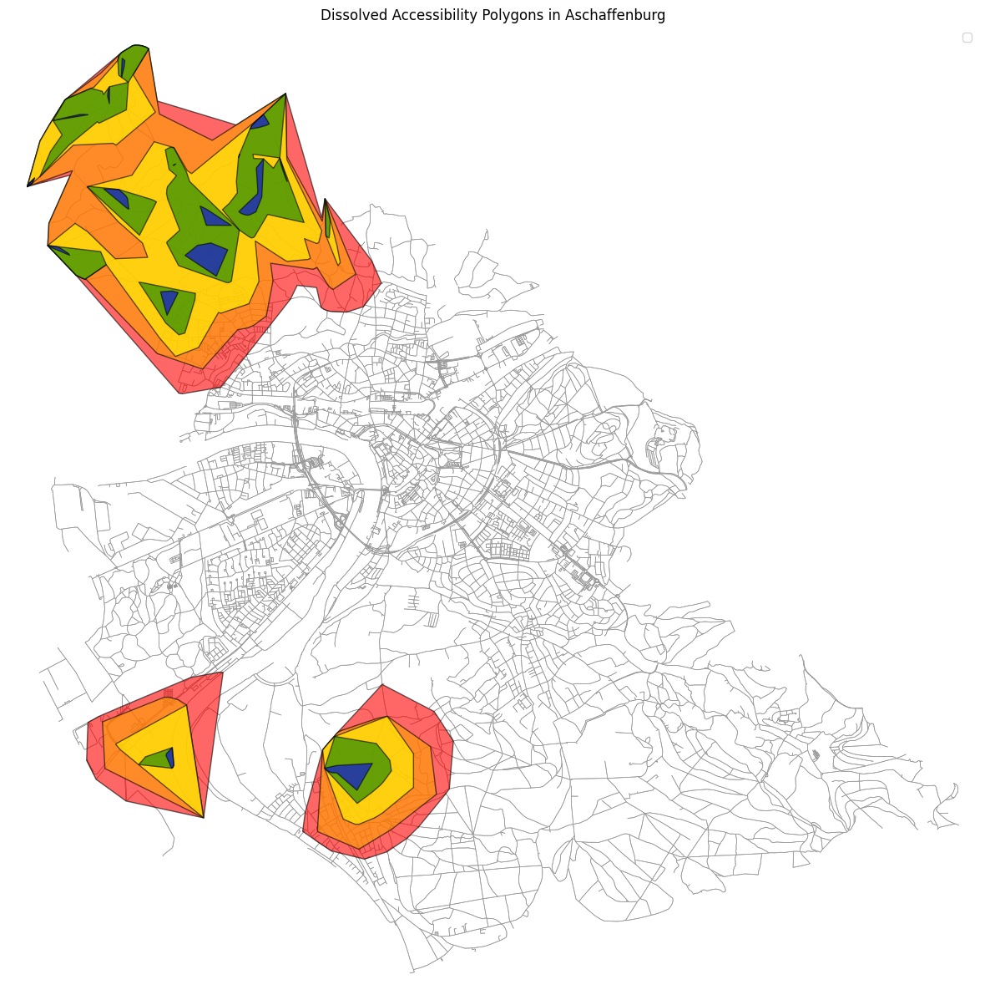

  Finished plotting for city: Aschaffenburg

Visualizing for city: Augsburg
  Accessed street network graph for Augsburg
  Accessed dissolved accessibility polygons data for Augsburg
  Projecting graph for Augsburg to EPSG:32632 for plotting
  Finished projecting graph for Augsburg
  Travel times found for Augsburg for plotting: [5, 10, 15, 20, 25]


/tmp/ipython-input-28-902740092.py:59: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
/tmp/ipython-input-28-902740092.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


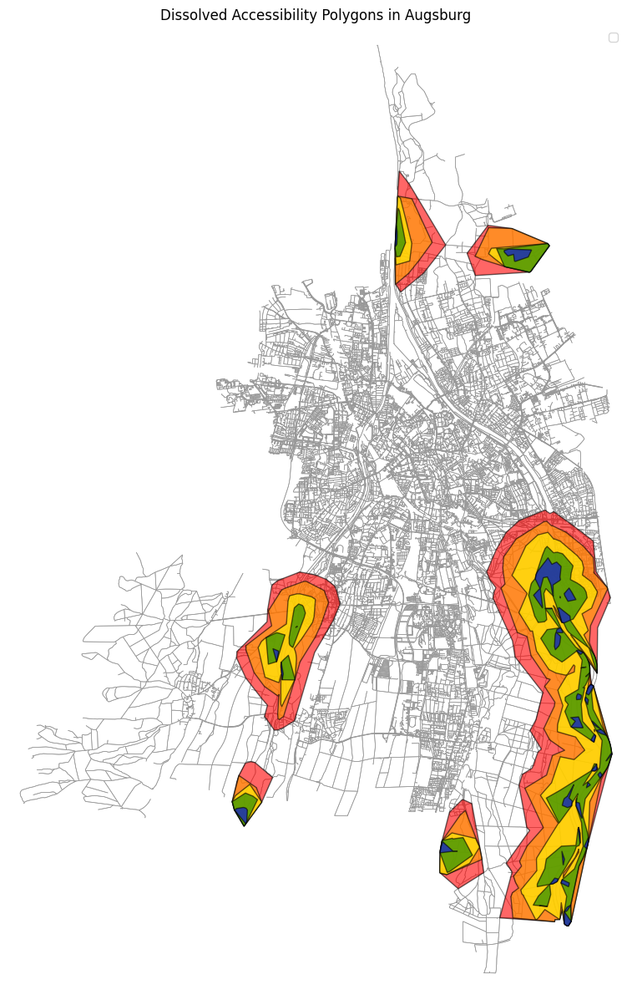

  Finished plotting for city: Augsburg

Visualizing for city: Bayreuth
  Accessed street network graph for Bayreuth
  Accessed dissolved accessibility polygons data for Bayreuth
  Projecting graph for Bayreuth to EPSG:32632 for plotting
  Finished projecting graph for Bayreuth
  Travel times found for Bayreuth for plotting: [5, 10, 15, 20, 25]


/tmp/ipython-input-28-902740092.py:59: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
/tmp/ipython-input-28-902740092.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


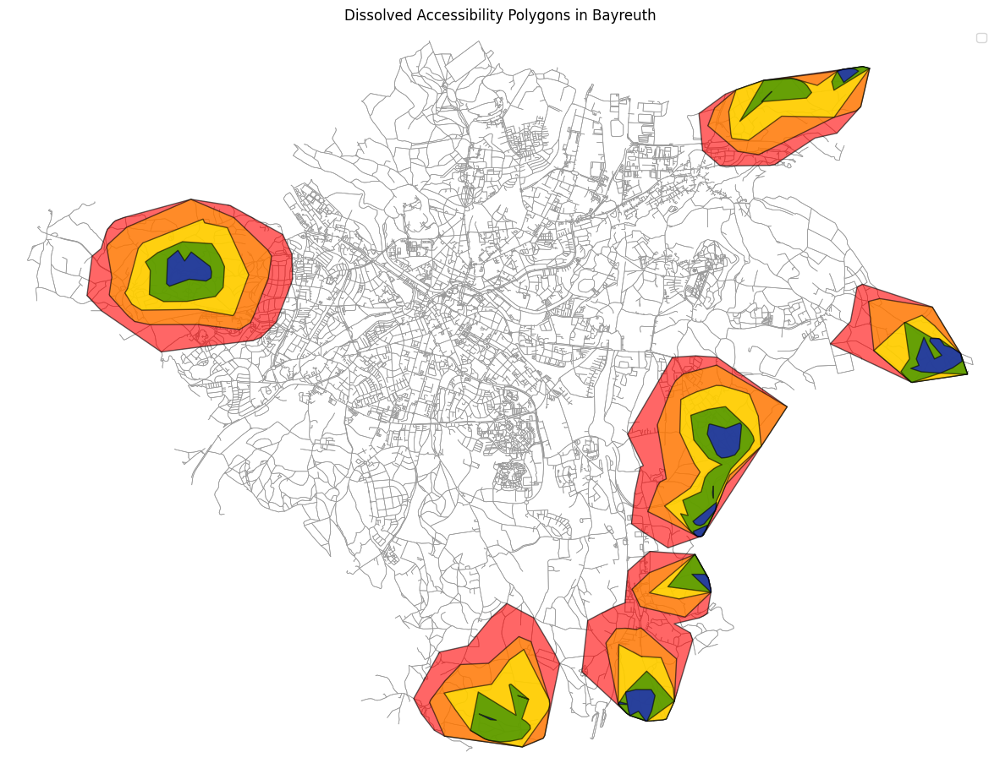

  Finished plotting for city: Bayreuth

Visualizing for city: Erlangen
  Accessed street network graph for Erlangen
  Accessed dissolved accessibility polygons data for Erlangen
  Projecting graph for Erlangen to EPSG:32632 for plotting
  Finished projecting graph for Erlangen
  Travel times found for Erlangen for plotting: [5, 10, 15, 20, 25]


/tmp/ipython-input-28-902740092.py:59: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
/tmp/ipython-input-28-902740092.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


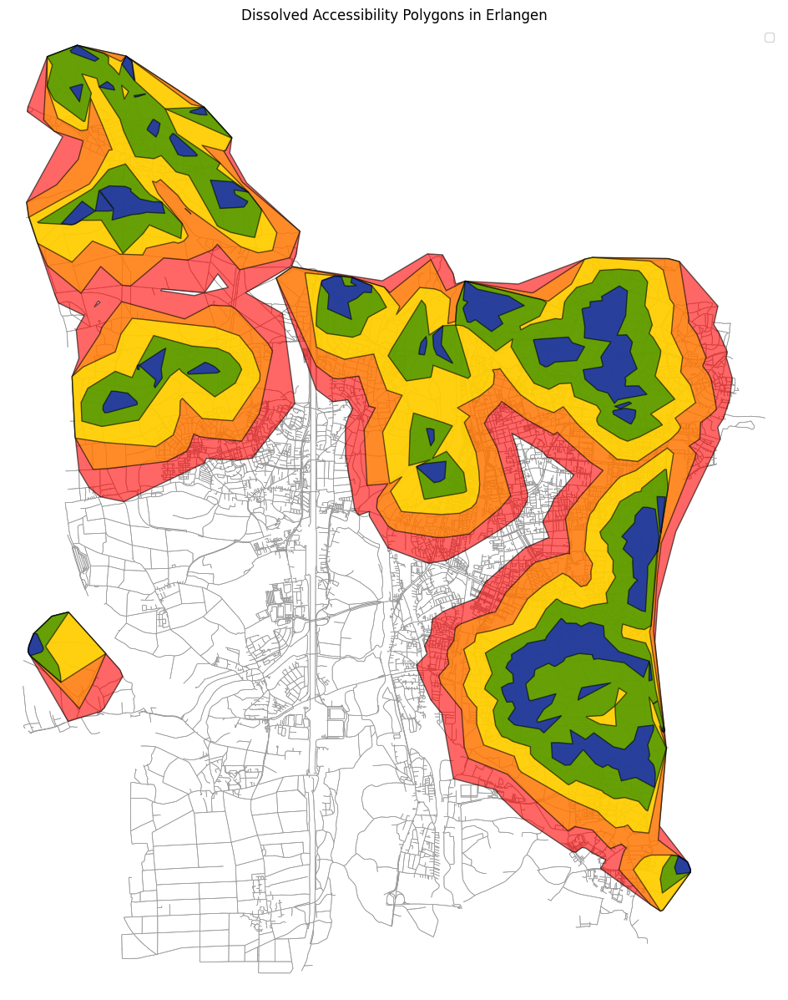

  Finished plotting for city: Erlangen
Dissolved accessibility polygons data not found or is empty for Fürth. Skipping plotting for this city.

Visualizing for city: Ingolstadt
  Accessed street network graph for Ingolstadt
  Accessed dissolved accessibility polygons data for Ingolstadt
  Projecting graph for Ingolstadt to EPSG:32632 for plotting
  Finished projecting graph for Ingolstadt
  Travel times found for Ingolstadt for plotting: [5, 10, 15, 20, 25]


/tmp/ipython-input-28-902740092.py:59: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
/tmp/ipython-input-28-902740092.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


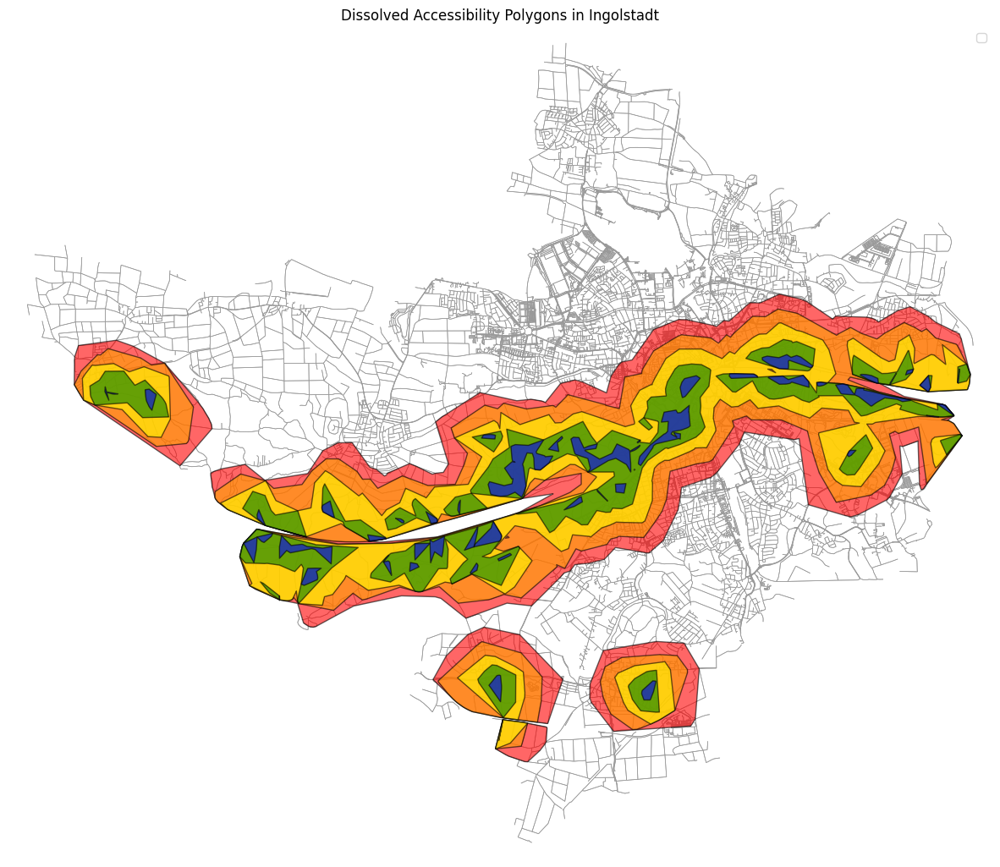

  Finished plotting for city: Ingolstadt
Dissolved accessibility polygons data not found or is empty for Kempten (Allgäu). Skipping plotting for this city.

Visualizing for city: Landshut
  Accessed street network graph for Landshut
  Accessed dissolved accessibility polygons data for Landshut
  Projecting graph for Landshut to EPSG:32632 for plotting
  Finished projecting graph for Landshut
  Travel times found for Landshut for plotting: [5, 10, 15, 20, 25]


/tmp/ipython-input-28-902740092.py:59: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
/tmp/ipython-input-28-902740092.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


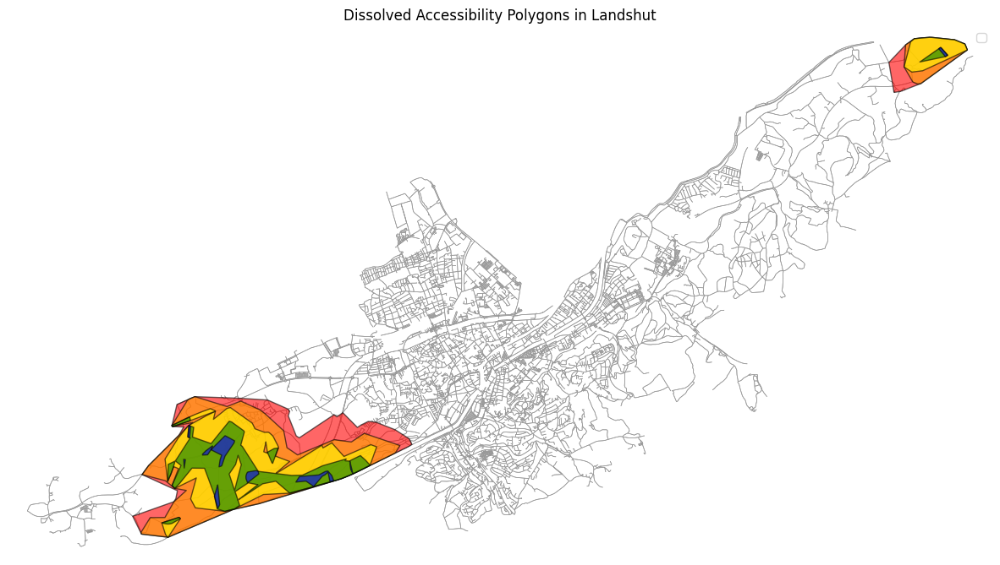

  Finished plotting for city: Landshut

Visualizing for city: Passau
  Accessed street network graph for Passau
  Accessed dissolved accessibility polygons data for Passau
  Projecting graph for Passau to EPSG:32632 for plotting
  Finished projecting graph for Passau
  Travel times found for Passau for plotting: [5, 10, 15, 20, 25]


/tmp/ipython-input-28-902740092.py:59: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
/tmp/ipython-input-28-902740092.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


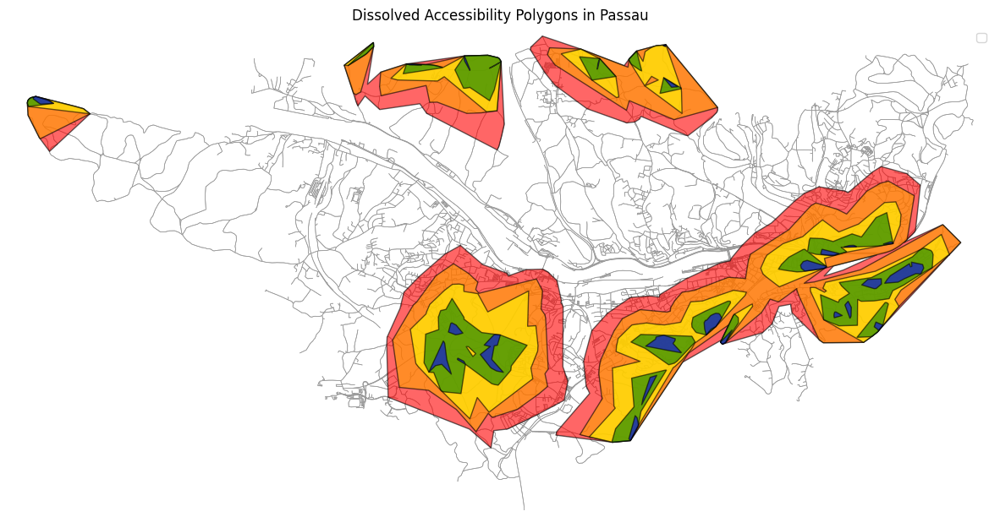

  Finished plotting for city: Passau

Visualizing for city: Regensburg
  Accessed street network graph for Regensburg
  Accessed dissolved accessibility polygons data for Regensburg
  Projecting graph for Regensburg to EPSG:32632 for plotting
  Finished projecting graph for Regensburg
  Travel times found for Regensburg for plotting: [5, 10, 15, 20, 25]


/tmp/ipython-input-28-902740092.py:59: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
/tmp/ipython-input-28-902740092.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


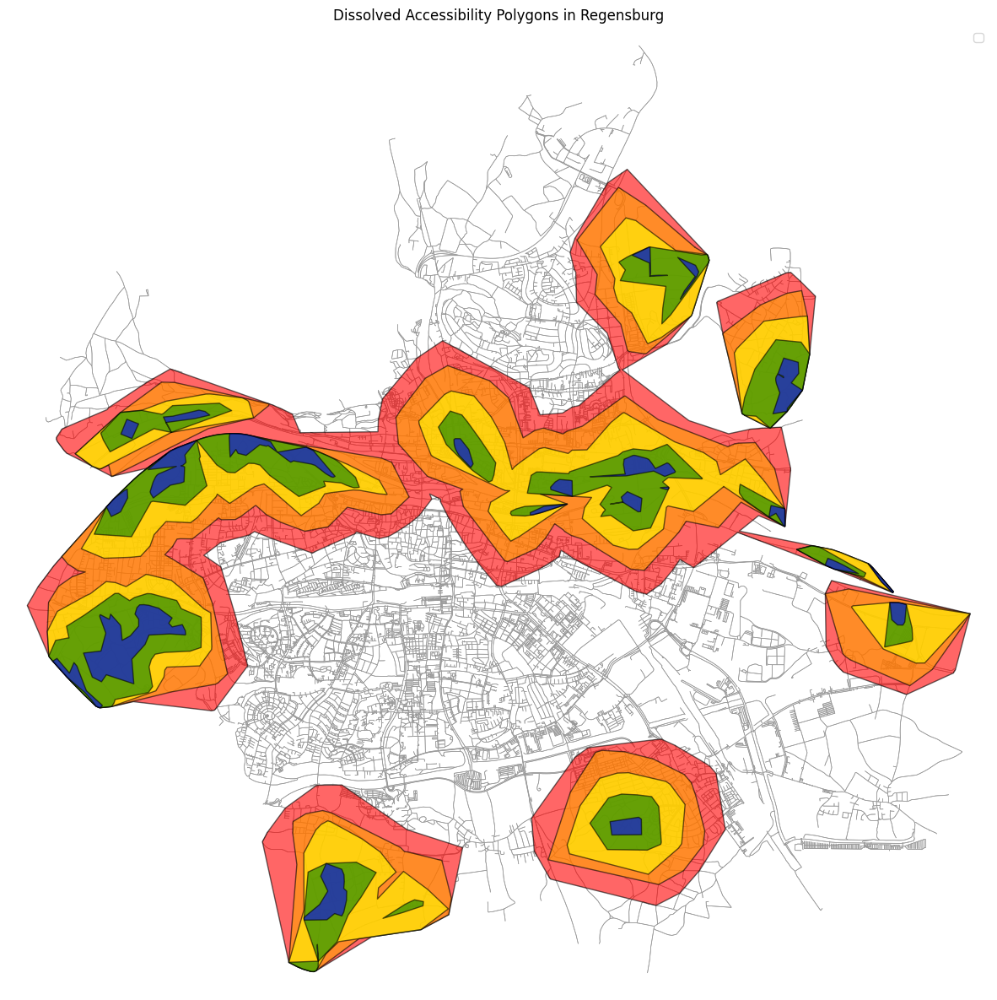

  Finished plotting for city: Regensburg
Dissolved accessibility polygons data not found or is empty for Rosennheim. Skipping plotting for this city.

Visualizing for city: Schweinfurt
  Accessed street network graph for Schweinfurt
  Accessed dissolved accessibility polygons data for Schweinfurt
  Projecting graph for Schweinfurt to EPSG:32632 for plotting
  Finished projecting graph for Schweinfurt
  Travel times found for Schweinfurt for plotting: [5, 10, 15, 20, 25]


/tmp/ipython-input-28-902740092.py:59: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()
/tmp/ipython-input-28-902740092.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


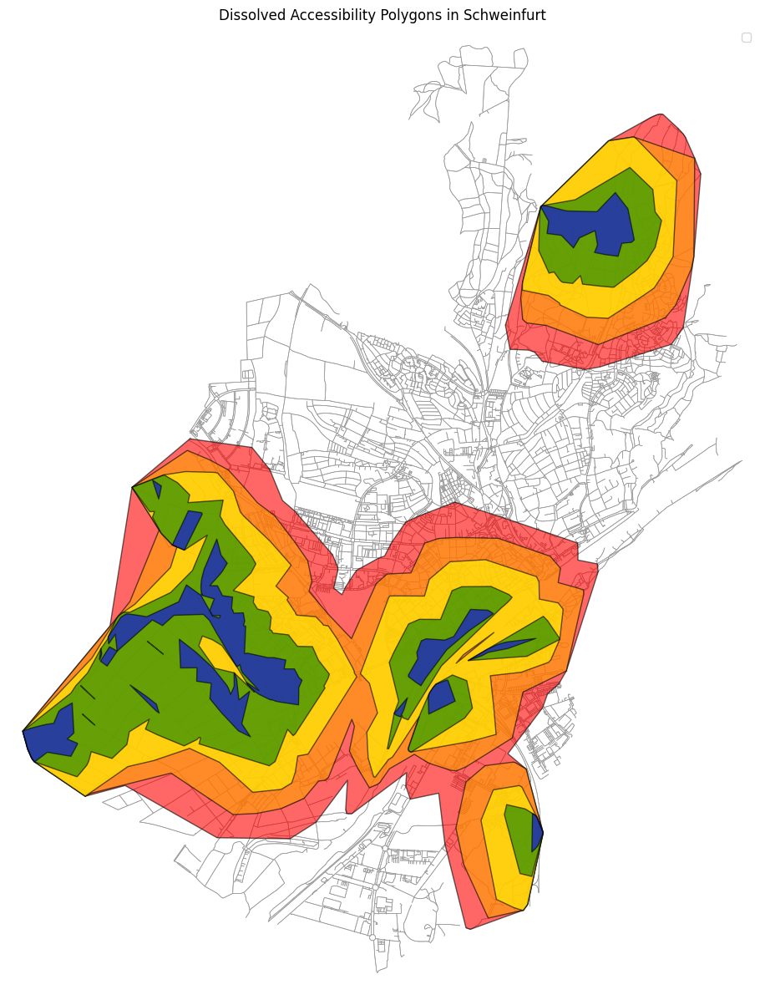

  Finished plotting for city: Schweinfurt
Dissolved accessibility polygons data not found or is empty for Würzburg. Skipping plotting for this city.

Finished visualizing dissolved accessibility polygons for selected cities.


In [28]:
import matplotlib.pyplot as plt
import osmnx as ox
import geopandas as gpd

# Define a list of cities to visualize (subset of processed cities, excluding Nuremberg)
cities_to_visualize = ['Aschaffenburg', 'Augsburg', 'Bayreuth','Erlangen', 'Fürth', 'Ingolstadt', 'Kempten (Allgäu)', 'Landshut', 'Passau', 'Regensburg', 'Rosennheim', 'Schweinfurt', 'Würzburg'] # You can change this list

print(f"\nVisualizing dissolved accessibility polygons for selected cities (excluding Nuremberg): {cities_to_visualize}")

# Iterate through the selected cities for visualization
for city_name in cities_to_visualize:
    if city_name in dissolved_accessibility_polygons_all_cities and dissolved_accessibility_polygons_all_cities[city_name]:
        print(f"\nVisualizing for city: {city_name}")

        # Access the street network graph for the current city
        if city_name in graphs:
            G = graphs[city_name]
            print(f"  Accessed street network graph for {city_name}")

            # Access the dissolved accessibility polygons for the current city
            city_dissolved_polygons = dissolved_accessibility_polygons_all_cities[city_name]
            print(f"  Accessed dissolved accessibility polygons data for {city_name}")

            # Project the graph to the same CRS as the accessibility polygons (EPSG:32632)
            if G.graph['crs'] != 'epsg:32632':
                print(f"  Projecting graph for {city_name} to EPSG:32632 for plotting")
                graph_proj = ox.project_graph(G, to_crs='epsg:32632')
                print(f"  Finished projecting graph for {city_name}")
            else:
                graph_proj = G
                print(f"  Graph for {city_name} is already in EPSG:32632")

            # --- Plotting ---
            # Create a single figure and axes for the current city
            fig, ax = plt.subplots(figsize=(15, 15))

            # Plot the street network
            ox.plot_graph(graph_proj, ax=ax, node_size=0, edge_color='#999999', edge_linewidth=0.5, show=False, close=False) # Reduced linewidth

            colors = ['blue', 'green', 'yellow', 'orange', 'red'] # Colors for different travel times (reversed for layering)
            # Get and sort travel times for consistent layering (shortest time last to be on top)
            travel_times_sorted = sorted(city_dissolved_polygons.keys())
            print(f"  Travel times found for {city_name} for plotting: {travel_times_sorted}") # Debug print


            # Plot dissolved accessibility polygons for each travel time, ordered for layering
            # Plot in reverse order of travel time so shortest times are on top
            for i, travel_time_min in reversed(list(enumerate(travel_times_sorted))):
                 if travel_time_min in city_dissolved_polygons:
                      polygon_gdf = city_dissolved_polygons[travel_time_min]
                      if not polygon_gdf.empty:
                           # Plot the polygon with a specific color and transparency
                           polygon_gdf.plot(ax=ax, color=colors[i % len(colors)], alpha=0.6, edgecolor='black', label=f'{travel_time_min} min')
                           # print(f"    Plotted dissolved polygon for {travel_time_min} minutes.") # Optional debug print
                      else:
                           print(f"    No dissolved polygon found for {travel_time_min} minutes for {city_name}.")

            ax.set_title(f"Dissolved Accessibility Polygons in {city_name}")
            ax.legend()
            plt.show()
            print(f"  Finished plotting for city: {city_name}")

        else:
            print(f"  Street network graph not found for {city_name} for plotting. Skipping plotting for this city.")

    else:
        print(f"Dissolved accessibility polygons data not found or is empty for {city_name}. Skipping plotting for this city.")

print(f"\nFinished visualizing dissolved accessibility polygons for selected cities.")

**Würzburg (auch die Daten), Fürth und Kempten fehlen hier noch**

Würzburg, Nürnberg und München fehlen noch ganz im Notebook: München: müssen noch Gi* 2024 berechnet werden (Notebook: Vergleich_2024_mit_Gesamtzeitraum), Nürnberg, Würzburg und dann auch München: Service Area Analyse mit reduzierten Startpunkten (hier im Notebook)